# Model evaluation

#### 0. Imports

In [ ]:
# Auto-reload packages
%load_ext autoreload
%autoreload 2

# General Libraries
import math
import random
import sys
import warnings
from datetime import datetime

# Data Handling and Processing
import numpy as np
import pandas as pd
import polars as pl
from typing import List, Union, Optional, Dict

# Scikit-learn and Forecasting
import sklearn
import skforecast
from skforecast.plot import plot_residuals, plot_prediction_distribution, set_dark_theme
from skforecast.recursive import ForecasterRecursiveMultiSeries, ForecasterRecursive
from skforecast.direct import ForecasterDirectMultiVariate
from skforecast.model_selection import TimeSeriesFold, OneStepAheadFold, backtesting_forecaster, bayesian_search_forecaster, backtesting_forecaster_multiseries, bayesian_search_forecaster_multiseries
from skforecast.feature_selection import select_features_multiseries, select_features
from skforecast.preprocessing import RollingFeatures, series_long_to_dict, exog_long_to_dict
from skforecast.exceptions import OneStepAheadValidationWarning, MissingValuesWarning, LongTrainingWarning, IgnoredArgumentWarning, MissingExogWarning
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.feature_selection import RFECV, SequentialFeatureSelector
from sklearn.model_selection import TimeSeriesSplit
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer, make_column_selector
from xgboost import XGBRegressor

# Feature Engineering
from feature_engine.timeseries.forecasting import LagFeatures, WindowFeatures

# Plotting and Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import het_arch
from statsmodels.tsa.stattools import pacf, acf

# Time Series and Statistical Analysis
import networkx as nx

# Warnings Configuration
warnings.filterwarnings('once')
warnings.simplefilter('ignore', category=LongTrainingWarning)
warnings.simplefilter('ignore', category=IgnoredArgumentWarning)
warnings.simplefilter('ignore', category=MissingValuesWarning)
warnings.simplefilter('ignore', category=MissingExogWarning)

# Custom Modules
sys.path.append("..")
from src.support.data_transformation import TickerExtender, TechnicalIndicators, FileHandler
from src.support.timeseries_support import TimeSeriesAnalysis
from src.support.file_handling import FileHandler
import src.support.data_visualization as dv
from src.support.model_evaluation import long_series_exog_to_dict, evaluate_recursive_multiseries, evaluate_recursive_multiseries_separate, get_opening_days_market_exog
from src.support.model_evaluation import calculate_top_acf_pacf_df, get_stocks_info, evaluate_direct_multiseries, evaluate_recursive_multiseries_dataframe, get_calendar_cyclical_features

# Instantiate objects
ticker_extender = TickerExtender()
file_handler = FileHandler()

# System variables
import os
from pathlib import Path
from itertools import cycle, chain

# Progress Bar
from tqdm import tqdm

# SHAP
import shap

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# 1. Introduction to this notebook

The purpose of this notebook is to iterate through different model configurations and feature combinations to obtain the minimum error possible, in order to obtain the best model that can create confident probabilistic forcast intervals in the next steps of the study.

- Modelling approach: Forecast
- Datetime frequency: Business days
- Forecast horizon: 5 business days, 1 natural week. Forecast happens in the middle of last day of data and first day of prediction.
- Forecast frequency: Every week on weekends, for now. This makes handling of market schedules easier.
- Choice of tools: Skforecast
- Choice of architectures: Skforecast
    - Skforecast recursive:
        - Local
        - Global: Multiseries Forecaster Recursive.
            - Dataframe architecture
            - Dictionary of dataframes architecture
    - Skforecast direct:
        - Local
        - Gloabal: Multivariate Forecaster direct
- Choice of metrics: Mean Absolute Percentage Error


## 1.1 Focus of prediction

For this task, we will be focusing on predicting daily stock close prices. The purpose is to predict close prices every day at market close (excepting weekends), having time for the algorithms to retrain and output predictions for the following days.

## 1.2 Data import

#### Main tickers

In [4]:
print("Enriching ticker dataframes.")
base_dir = Path(os.getcwd()) # Ensure the right "relative" path is achivied by attaching the absolute path of the notebook
ticker_df_list = ticker_extender.transform_daily_tickers_parallel(base_dir / "../data/extracted/OHLCV")
print("Merging into one collection.")
merged_df_with_tech_ind = ticker_extender.merge_tickers(ticker_df_list)
del ticker_df_list

Enriching ticker dataframes.
Merging into one collection.


## 1.3 Choice of tools

- **Skforecast**: It is a library for easy and efficient time series Forecasting.

## 1.4 Metrics

The metric to be optimized by the model is the Mean Absolute Error. This choice above Mean Squared error is made due to the fact that very big deviations do not need to be avoided from predictions, as these deviations are capped by Stop Losses and Take Profit strategies (SL/TP). Through this choice, models will more accurately predict the most probable price.

The metric to be monitored when dealing with original values will be the Mean Absolute Percentage Error, as percentage growth rates of investmetns are what matter in stocks. When dealing with pct_change predictions, Mean Absolute Error will be monitored.

# 2. EDA

## 2.1 Define first dataset

The first approach consists of modelling each daily tickers data just by themselves. This means that the feature transformations seen in the previous notebooks do not apply yet. Then, iteratively, analysis is performed to improve upon each previous step by adding new features or modifying configurations. 

For now, we just import that data as per above and retain datetime and close price values.

In [5]:
dataframe_simple = merged_df_with_tech_ind["datetime","close","symbol"]

symbol_list = dataframe_simple["symbol"].unique().to_list()

dataframe_simple_pivot = dataframe_simple.pivot(
    on = "symbol",
    index = "datetime"
).select(["datetime"]+symbol_list).to_pandas().set_index("datetime").sort_index()

dataframe_simple # it is long format

datetime,close,symbol
datetime[ns],f64,str
2009-08-06 00:00:00,1.150074,"""AVGO"""
2009-08-07 00:00:00,1.167844,"""AVGO"""
2009-08-10 00:00:00,1.135147,"""AVGO"""
2009-08-11 00:00:00,1.113823,"""AVGO"""
2009-08-12 00:00:00,1.137279,"""AVGO"""
…,…,…
2025-02-03 00:00:00,57.560001,"""TTE"""
2025-02-04 00:00:00,59.189999,"""TTE"""
2025-02-05 00:00:00,60.32,"""TTE"""


The dataframe in long format will be needed for one 

## 2.2 Analysis

To make this analysis more approachable, we will focus on the timeframe that allows to have moderately enough time data, but so all tickers start at the same time.

In [7]:
targets = dataframe_simple_pivot.columns.to_list() # Series to be predicted
data = dataframe_simple_pivot.copy().asfreq("B").interpolate().dropna()
forecast_horizon = 5 # timesteps, days in this case

#### Train/validation/test split

In [12]:
#### Train-test split
# Train test-split
# ======================================================================================
start_train = '2012-06-04'
end_train = '2018-05-27'
end_val = '2022-05-29'
end_test = '2025-01-24'
data_train = data.loc[:end_train, :].copy()
data_val   = data.loc[end_train:end_val, :].copy()
data_test  = data.loc[end_val:end_test, :].copy()
print(f"Fechas train      : {data_train.index.min()} --- {data_train.index.max()}  (n={len(data_train)})")
print(f"Fechas validación : {data_val.index.min()} --- {data_val.index.max()}  (n={len(data_val)})")
print(f"Fechas test       : {data_test.index.min()} --- {data_test.index.max()}  (n={len(data_test)})")

Fechas train      : 2012-05-18 00:00:00 --- 2018-05-25 00:00:00  (n=1571)
Fechas validación : 2018-05-28 00:00:00 --- 2022-05-27 00:00:00  (n=1045)
Fechas test       : 2022-05-30 00:00:00 --- 2025-01-24 00:00:00  (n=695)


Let's visualise all the tickers included in the initial dataset together, with their train/validation/test splits.

In [ ]:
n_rows=math.ceil(len(targets)/2)
fig, axes = plt.subplots(n_rows,2, figsize=(20,3*n_rows), sharex=True)
axes = axes.flat 
fig.suptitle(f"Stock valuation of {len(targets)} different companies from {data.index.min().year} until today", fontsize=14, y=1.01)

color_cycle = cycle(plt.rcParams['axes.prop_cycle'].by_key()['color'])

for column, ax in zip(data, axes):
    sns.lineplot(data=data,
                 x=data.index,
                 y=data[column], 
                 ax=ax,
                 color=next(color_cycle),
                 label=column)    
    ax.axvline(pd.to_datetime(end_train) , color='white', linestyle='--', linewidth=1.5)
    ax.axvline(pd.to_datetime(end_val) , color='white', linestyle='--', linewidth=1.5)

plt.tight_layout()

There are stocks that look noisier than others, however that is due to scale. 

Let's perform a quick check on missing data, as appart market close days there should not be any. Also, let's plot the time series decomposition of "AAPL", which is taken as an example under the assumption that the overall trend and seasonal nature of stocks is similar among tickers.

In [ ]:
ts_analizer = TimeSeriesAnalysis(data, value_column="AAPL")

ts_analizer.exploracion_datos()

ts_analizer.detectar_estacionalidad(model="additive")

From the time series decomposition we can extract that:
- Stocks data shows an obvious trend
- Seasonality patterns are non-existent. However, non-uniform fluctuations happen all the time.
- The residuals show hetoskedasticity with growing variance over time that follows the trend magnitude.

For this kind of residuals, a multiplicative model is more appropriate. We can also try to introduce a period:


In [ ]:
ts_analizer.detectar_estacionalidad(model="multiplicative", period=5)

Here, residuals do not seem to increase in magnitude overtime. The introduction of the period is forcing a seasonality that does not exist into the model. Therefore, we can only affirm that a strong trend is found, with some kind of multiplicative effect.

Trend needs to be differenced for traditional statistical methods like ARIMA and SARIMA. The same thing applies for classical ML methods, where the distribution of the test set must be the same or the most similar possible for the algorithm to perform well. Let's plot the original, differenced and pertange differenced time series along with Augmented Dickey Fuller test for stationarity and the ARCH test for time series heteroskedasticity test.

In [ ]:
print("Stationarity Augmented Dickey Fuller test - original series:")
data["AAPL"].plot.line()
ts_analizer.prueba_estacionariedad(data["AAPL"])
test_statistic, p_value, lags, critical_values = het_arch(data["AAPL"])
print(f'ARCH test p-value: {p_value}')
print(f'Number of volatility lags: {lags}')
plt.show()


print("\nStationarity Augmented Dickey Fuller test - differentiated series:")
data["AAPL"].diff(1).plot.line()
ts_analizer.prueba_estacionariedad(data["AAPL"].diff(1))
test_statistic, p_value, lags, critical_values = het_arch(data["AAPL"].diff(1).dropna())
print(f'ARCH test p-value: {p_value}')
print(f'Number of volatility lags: {lags}')
plt.show()

print("\nStationarity Augmented Dickey Fuller test - growth rate series:")
data["AAPL"].pct_change(1).plot.line()
ts_analizer.prueba_estacionariedad(data["AAPL"].pct_change(1))
test_statistic, p_value, lags, critical_values = het_arch(data["AAPL"].pct_change(1).dropna())
print(f'ARCH test p-value: {p_value}')
print(f'Number of volatility lags: {lags}')
plt.show()

As we can observe, both 1st order differentiation and 1lag pct_change achieve stationarity according to the ADF test. However, the plain differentiation is severly impacted by a change in variance. Stock values tend to increase over time, therefore, although differentiation accounts for changes in level, it does not completely account for changes in variance.

In this case, differencing through the pct_change or growth rate, although not a complete solution to variance changes accross the time series, do mitigate the problem better than differentiation. Besides, returns from stock investments come from the growth rate since the time of investment, and therefore these values make sense. 

### Seasonality analysis

Let's plot aggregated data over yearly seasonality, monthly seasonality and weekly seasonality, to check if there could be any approximate patterns not extracted by the seasonality decomposition.

In [ ]:
data_pct = data.pct_change().dropna()
n_rows=math.ceil(len(targets)/2)
fig, axes = plt.subplots(n_rows,2, figsize=(20,3*n_rows), sharex=True)
axes = axes.flat 
fig.suptitle(f"Stock valuation of {len(targets)} different companies from {data_pct.index.min().year} until today", fontsize=14, y=1.01)

color_cycle = cycle(plt.rcParams['axes.prop_cycle'].by_key()['color'])

for column, ax in zip(data, axes):
    sns.lineplot(data=data_pct,
                 x=data_pct.index.month,
                 y=data_pct[column], 
                 ax=ax,
                 color=next(color_cycle),
                 label=column)    

plt.tight_layout()

It seems there could be a pattern that is shared for some stocks, as some show similar shapes. For example CDI.PA (Christian Dior, Paris), OR.PA (L'Oreal, Paris) and MC.PA (Louis Vuitton, Paris) expose peaks in April, decay for the rest of the year and then peak again around November. This might be connected with their financial report puclication dates, as they publish quarterly reports during these dates. Therefore, it can be used to only both calendar or cyclical data, as well as fundamentals data por each period.

In [ ]:
data_pct = data.pct_change().dropna()
n_rows=math.ceil(len(targets)/2)
fig, axes = plt.subplots(n_rows,2, figsize=(20,3*n_rows), sharex=True)
axes = axes.flat 
fig.suptitle(f"Stock valuation of {len(targets)} different companies from {data_pct.index.min().year} until today", fontsize=14, y=1.01)

color_cycle = cycle(plt.rcParams['axes.prop_cycle'].by_key()['color'])

for column, ax in zip(data, axes):
    sns.lineplot(data=data_pct,
                 x=data_pct.index.day,
                 y=data_pct[column], 
                 ax=ax,
                 color=next(color_cycle),
                 label=column)    

plt.tight_layout()

Monthly seasonality gets a messier and it is difficult to find a pattern.

In [ ]:
data_pct = data.pct_change().dropna()
n_rows=math.ceil(len(targets)/2)
fig, axes = plt.subplots(n_rows,2, figsize=(20,3*n_rows), sharex=True)
axes = axes.flat 
fig.suptitle(f"Stock valuation of {len(targets)} different companies from {data_pct.index.min().year} until today", fontsize=14, y=1.01)

color_cycle = cycle(plt.rcParams['axes.prop_cycle'].by_key()['color'])

for column, ax in zip(data, axes):
    sns.lineplot(data=data_pct,
                 x=data_pct.index.day_name(),
                 y=data_pct[column], 
                 ax=ax,
                 color=next(color_cycle),
                 label=column)    

plt.tight_layout()

Here again, some stocks show some significant decline or increase in price throughout the week, for example Reliance tends to grow less or reduce its price on Thursdays, as do some other stocks. Therefore, the minimum approach to this is to at least add calendar and cyclical features.

The next step is chosing the best moving average rolling window size and the number of lags to account for. If we do not differentiate the series, we can see that the trend covers most lagged effects.

### Autorregressive lag choice

Plotting the ACF plots for a sample of 8 stocks:

In [ ]:
# Autocorrelation plots
# ==============================================================================
n_rows=math.ceil(len(targets)/2)
n_lags = 30 * 3
cols_to_plot = dataframe_simple_pivot.columns[:8]
fig, axs = plt.subplots(4, 2, figsize=(12, 6))
axs = axs.flat
for i, col in enumerate(cols_to_plot):
    plot_acf(data[col], lags=n_lags, ax=axs[i])
    axs[i].set_title(col, fontsize=10)
    axs[i].set_ylim(-0.5, 1.1)
plt.tight_layout()

There is a clear indication of autocorrelation, for some stocks more than for others. For example IDEXY (Inditex) seems to depend less on its past values than the other stocks.

However, when differentiating with the pct_change, we can see that dependences from past values are not that strong, indicating that past price values depend on other factors, rather than past values. Below the plots for all of the ACF lags for the differenced time series along with the calculation of the top most relevant lags for each stock.

Showing all possible lags:
TCS.NS: [32, 26, 11, 33, 19]
ITC.NS: [5, 28, 25, 37, 4]
JPM: [7, 1, 13, 4, 9]
SBIN.NS: [54, 9, 6, 48, 60]
HINDUNILVR.NS: [56, 7, 34, 32, 23]
SAP: [1, 2, 6, 20, 46]
MSFT: [1, 9, 8, 6, 14]
SIE.DE: [38, 9, 8, 12, 13]
IBN: [9, 60, 49, 27, 6]
RMS.PA: [38, 3, 33, 24, 6]
GOOG: [9, 8, 50, 13, 7]
CDI.PA: [6, 7, 18, 50, 22]
BHARTIARTL.NS: [41, 47, 3, 55, 17]
IDEXY: [6, 49, 1, 14, 45]
LT.NS: [1, 37, 60, 9, 5]
AVGO: [13, 1, 6, 8, 9]
BRK-B: [7, 1, 6, 45, 8]
ACN: [9, 8, 7, 6, 1]
NVDA: [1, 55, 50, 17, 7]
META: [40, 42, 30, 52, 9]
NVO: [10, 59, 35, 13, 8]
V: [1, 6, 9, 15, 13]
MC.PA: [24, 7, 14, 26, 1]
RELIANCE.NS: [6, 44, 37, 56, 18]
INFY: [34, 44, 9, 23, 45]
HDB: [27, 6, 29, 58, 26]
ASML: [8, 7, 1, 41, 10]
LLY: [10, 8, 27, 32, 29]
AMZN: [56, 42, 18, 8, 26]
AAPL: [9, 8, 14, 7, 1]
OR.PA: [1, 14, 38, 3, 42]
TTE: [2, 10, 13, 45, 4]


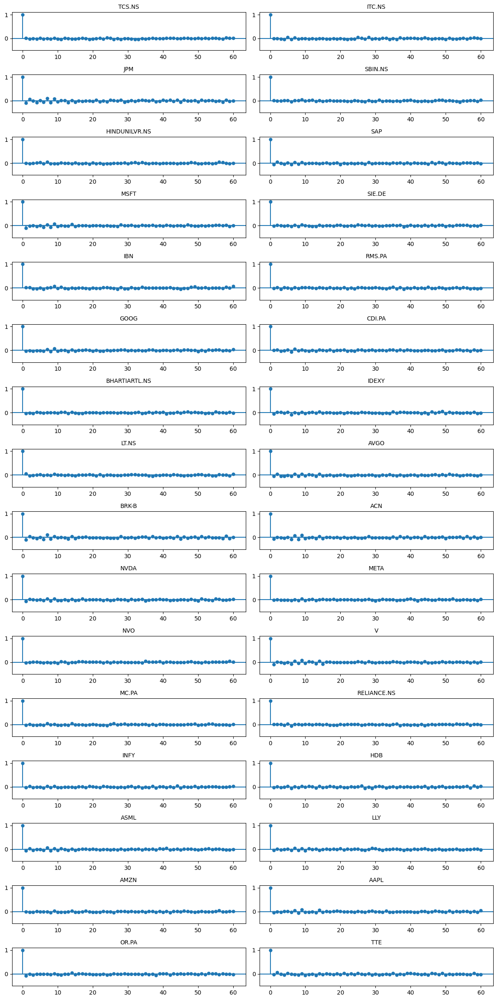

In [8]:
top_lags_acf, top_lags_acf_dict  = calculate_top_acf_pacf_df(data, data.columns, n_lags=60, method='acf')

Now the same inspecting and storing partial autocorrelation values for lags.

Showing all possible lags:
TCS.NS: [32, 26, 33, 11, 19]
ITC.NS: [28, 5, 25, 37, 4]
JPM: [7, 1, 4, 9, 13]
SBIN.NS: [54, 6, 9, 48, 31]
HINDUNILVR.NS: [56, 7, 34, 57, 32]
SAP: [1, 2, 6, 20, 4]
MSFT: [1, 8, 6, 9, 27]
SIE.DE: [38, 12, 9, 8, 13]
IBN: [9, 60, 49, 45, 6]
RMS.PA: [38, 3, 6, 24, 45]
GOOG: [9, 8, 50, 23, 13]
CDI.PA: [6, 7, 18, 22, 46]
BHARTIARTL.NS: [41, 3, 47, 55, 49]
IDEXY: [6, 49, 1, 35, 14]
LT.NS: [1, 37, 60, 9, 5]
AVGO: [13, 1, 6, 4, 31]
BRK-B: [7, 1, 6, 45, 37]
ACN: [9, 7, 8, 6, 1]
NVDA: [1, 50, 17, 55, 7]
META: [40, 42, 52, 30, 9]
NVO: [10, 23, 59, 13, 8]
V: [1, 6, 9, 13, 15]
MC.PA: [24, 7, 26, 14, 6]
RELIANCE.NS: [6, 44, 37, 56, 4]
INFY: [34, 23, 6, 38, 9]
HDB: [27, 6, 26, 58, 29]
ASML: [8, 7, 1, 41, 13]
LLY: [10, 27, 8, 6, 32]
AMZN: [56, 42, 8, 18, 9]
AAPL: [9, 8, 14, 7, 1]
OR.PA: [1, 14, 38, 3, 42]
TTE: [2, 10, 13, 4, 8]


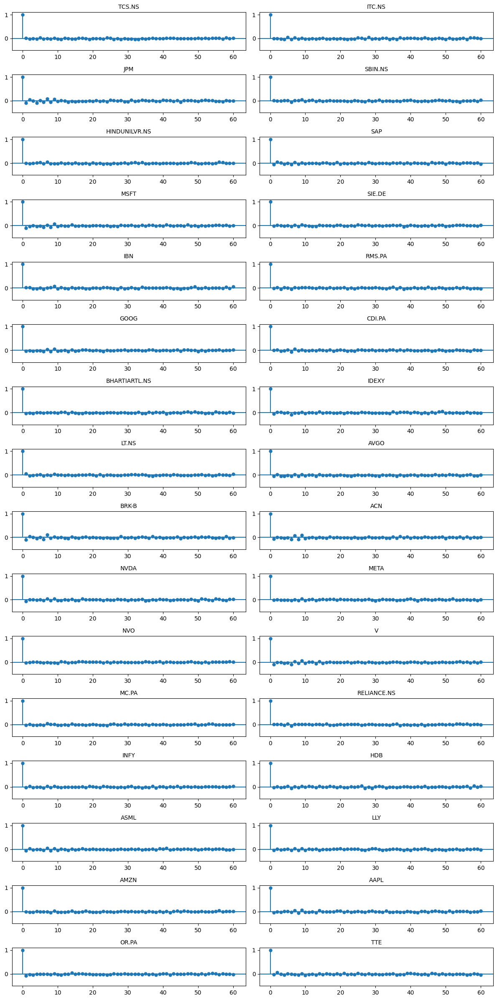

In [9]:
top_lags_pacf, top_lags_pacf_dict = calculate_top_acf_pacf_df(data, data.columns, n_lags=60, method='pacf')

It can be seen that appart from the most recent lags, most lags are not consistently significant. Therefore, the approach is to use the most significant lags calculated above to introduce them to the models and see what works best.

# 3. Modelling

For forecast modelling with multiple time series there are a few approaches that can be tested. 
- Recursive vs. Direct: Recursive creaates a single model that predicts each forecast horizon and recursively uses the previously forecasted step along with the real values to predict the values ahead. Direct creates a separate model for each of the steps in the forecast horizon. Recursive is lighter than direct, but might incurr in bigger error.
- Global models vs. local models. Global models put all time series in a single model, where as local models focus on one time series at a time.
- Dependent time series vs. independent time series. Dependent time series take into account the values of other related time series along with its own values to forecast itself. Independent time series uses only its own values to forcast itself.

These can be combined in a way such that we can have:
- Local direct. It takes the time series + the exogenous features and creates one model per forecasting step. In our case, it would create 5 models.
- Global multivariate (dependent) direct. It would take the time series along with other time series to create a "wider" table, by using its own values and the other time serie's to create features to predict ahead. Being direct, this would be for 5 separate models.
- Local recursive. It takes the time series + exogenous features to create one single model that uses its past values, predicted or real, to forecast ahead.
- Global multeries (independent) recursive. It takes all time series, creating a single model that is able to predict all time series introduced. Each time series would use only its own past values, predicted or real, to forecast ahead. However, the model internally creates a long table that provides more examples gaining in generalization at the expense of spcifics. This model has 2 variations:
    - Common exogenous features model, takes as input a single long dataframe. It has the drawback that all time series must share the same dates and also the same exogenous features.
    - Separates time series model. Takes as input a long table, with each time series stacked vertically. It has 2 main benefits over the above variation; time series can differ in length and can take different exogenous features.

## 3.1 Compare approaches for multiseries modelling - recursive models

### 3.1.1 Local recursive

In [30]:
# Entrenar y realizar backtesting de un modelo para cada item
# ======================================================================================
items = []
mape_values = []
predictions = {}
forecasters = {}

for i, item in enumerate(tqdm(data[targets].columns[:8])):
    # Definir el forecaster
    window_features = RollingFeatures(stats=['mean']*len(top_lags_acf_dict[item]), window_sizes=top_lags_acf_dict[item])
    forecasters[item] = ForecasterRecursive(
                     regressor       = HistGradientBoostingRegressor(random_state=8523, loss="absolute_error"),
                     lags            = top_lags_pacf_dict[item],
                     window_features = window_features,
                     differentiation = 1
                 )
    forecasters[item].fit(y=data.loc[start_train:end_val,item])
    # Backtesting forecaster
    cv = TimeSeriesFold(
            steps              = forecast_horizon, # =7
            initial_train_size = len(data.loc[start_train:end_val,item]),
            refit              = 8,
            fixed_train_size   = True,
            differentiation = 1
         )
    metric, preds = backtesting_forecaster(
                        forecaster    = forecasters[item],
                        y             = data.loc[start_train:end_test,item],
                        cv            = cv,
                        metric        = 'mean_absolute_percentage_error', 
                        verbose       = False,
                        show_progress = False
                    )
    items.append(item)
    mape_values.append(metric.at[0, 'mean_absolute_percentage_error'])
    predictions[item] = preds

# Resultados
uni_series_mape = pd.DataFrame({
                    "levels": items,
                    "mean_absolute_percentage_error": mape_values
                    })
uni_series_mape
print(f"The mean MAPE for uniseries is {uni_series_mape['mean_absolute_percentage_error'].mean():.4f}")

100%|██████████| 8/8 [04:17<00:00, 32.21s/it]

The mean MAPE for uniseries is 0.0176


### 3.1.2 Global recursive (independent) - single dataframe

In [ ]:
# Define the forecaster. 
window_features = RollingFeatures(stats=['mean']*len(top_lags_acf), window_sizes=top_lags_acf) # window features de prueba. Esto me puede servir para soportes y resistencias. 
forecaster_ms_1 = ForecasterRecursiveMultiSeries(
                    regressor       = HistGradientBoostingRegressor(random_state=8523, loss="absolute_error"),
                    lags            = top_lags_pacf, # lags de prueba
                    transformer_series = StandardScaler(),
                    window_features=window_features,
                    differentiation=1
                )

forecaster_ms_1.fit(series=data.loc[start_train:end_val,], exog=None, suppress_warnings=True)
display(forecaster_ms_1)

# Backtesitng 
cv = TimeSeriesFold(
            steps              = forecast_horizon,
            initial_train_size = len(data.loc[start_train:end_val,],),
            refit              = 8,
            fixed_train_size   = True,
            differentiation=1
         )

multi_series_mae_1, predictions_1 = backtesting_forecaster_multiseries(
                                       forecaster            = forecaster_ms_1,
                                       series                = data.loc[start_train:end_test,], 
                                       levels                = targets,
                                       cv                    = cv,
                                       metric                = 'mean_absolute_percentage_error',
                                       add_aggregated_metric = False,
                                       verbose               = False,
                                       show_progress         = True  
                                   )   
# Resultados
display(multi_series_mae_1)
print(f"Mean MAPE error accross series is {multi_series_mae_1['mean_absolute_percentage_error'].mean():.4f}")

print('')
display(predictions_1)

This approach is similar in terms of MAPE, but a lot easier to train. However, it has a big drawback and it is that features all need to have the same dates, where actually some stocks had their first IPO at very different times. 

As an additional issue, although multiseries tends to have much faster times of training, the huge amount of rolling windows and lags it has received from the prior selection has slowed down its training. Therefore, this method can be greatly improved through either clustering similar stocks or stocks with the highest amount of correlation/interaction.

Let's try another approach that works as long as there is data for all train, test and validation.

### 3.1.3 Global recursive (independent) - separate time series

In [10]:
targets = dataframe_simple["symbol"].unique().to_list()
data_vertical = dataframe_simple
forecast_horizon = 5 # timesteps, days in this case

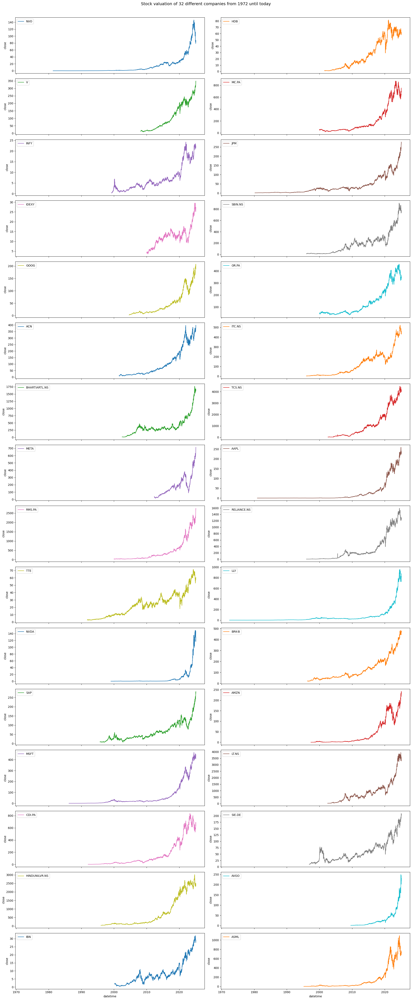

In [13]:
n_rows=math.ceil(len(targets)/2)
fig, axes = plt.subplots(n_rows,2, figsize=(20,3*n_rows), sharex=True)
axes = axes.flat 
fig.suptitle(f"Stock valuation of {len(targets)} different companies from {data_vertical['datetime'].dt.year().min()} until today", fontsize=14, y=1.005)

color_cycle = cycle(plt.rcParams['axes.prop_cycle'].by_key()['color'])

for ticker, ax in zip(targets, axes):
    sns.lineplot(data=data_vertical.filter(pl.col("symbol")==ticker),
                 x="datetime",
                 y="close", 
                 ax=ax,
                 color=next(color_cycle),
                 label=ticker)
    ax.axvline(pd.to_datetime(end_val), color='white', linestyle='--', linewidth=1)

plt.tight_layout()

In [14]:
data_symbol_global = pd.DataFrame()
for symbol in data_vertical["symbol"].unique().to_list():
    data_symbol = data_vertical.filter(pl.col("symbol")==symbol, pl.col("datetime")>datetime(2012,5,18)).select("datetime","close").to_pandas().set_index("datetime").asfreq("B").interpolate()
    data_symbol["symbol"] = symbol
    data_symbol_global = pd.concat([data_symbol_global,data_symbol])

data_symbol_global

,close,symbol
datetime,,
2012-05-21,16.909504,AAPL
2012-05-22,16.779659,AAPL
2012-05-23,17.189081,AAPL
2012-05-24,17.031218,AAPL
2012-05-25,16.939928,AAPL
...,...,...
2025-02-03,454.350006,ITC.NS
2025-02-04,455.149994,ITC.NS
2025-02-05,448.149994,ITC.NS


In [15]:
data_symbol_global.reset_index()

,datetime,close,symbol
0,2012-05-21,16.909504,AAPL
1,2012-05-22,16.779659,AAPL
2,2012-05-23,17.189081,AAPL
3,2012-05-24,17.031218,AAPL
4,2012-05-25,16.939928,AAPL
...,...,...,...
106235,2025-02-03,454.350006,ITC.NS
106236,2025-02-04,455.149994,ITC.NS
106237,2025-02-05,448.149994,ITC.NS
106238,2025-02-06,441.100006,ITC.NS


In [16]:
# Transform series and exog to dictionaries
# ==============================================================================
series_dict = series_long_to_dict(
                data      = data_symbol_global.reset_index(),
                series_id = 'symbol',
                index     = 'datetime',
                values    = 'close',
                freq      = 'B'
              )


In [17]:
# Particiones de entrenamiento y test
# ==============================================================================
series_dict_train = {k: v.loc[start_train: end_val,] for k, v in series_dict.items()}
# exog_dict_train   = {k: v.loc[: end_train,] for k, v in exog_dict.items()}
series_dict_test  = {k: v.loc[end_val:end_test,] for k, v in series_dict.items()}
# exog_dict_test    = {k: v.loc[end_train:,] for k, v in exog_dict.items()}

# Descripción de cada serie
# ==============================================================================
for k in series_dict.keys():
    print(f"{k}:")
    try:
        print(
            f"\tTrain: len={len(series_dict_train[k])}, {series_dict_train[k].index[0]}"
            f" --- {series_dict_train[k].index[-1]} "
            f" (missing={series_dict_train[k].isnull().sum()})"
        )
    except:
        print(f"\tTrain: len=0")
    try:
        print(
            f"\tTest : len={len(series_dict_test[k])}, {series_dict_test[k].index[0]}"
            f" --- {series_dict_test[k].index[-1]} "
            f" (missing={series_dict_test[k].isnull().sum()})"
        )
    except:
        print(f"\tTest : len=0")

AAPL:
	Train: len=2605, 2012-06-04 00:00:00 --- 2022-05-27 00:00:00  (missing=0)
	Test : len=695, 2022-05-30 00:00:00 --- 2025-01-24 00:00:00  (missing=0)
ACN:
	Train: len=2605, 2012-06-04 00:00:00 --- 2022-05-27 00:00:00  (missing=0)
	Test : len=695, 2022-05-30 00:00:00 --- 2025-01-24 00:00:00  (missing=0)
AMZN:
	Train: len=2605, 2012-06-04 00:00:00 --- 2022-05-27 00:00:00  (missing=0)
	Test : len=695, 2022-05-30 00:00:00 --- 2025-01-24 00:00:00  (missing=0)
ASML:
	Train: len=2605, 2012-06-04 00:00:00 --- 2022-05-27 00:00:00  (missing=0)
	Test : len=695, 2022-05-30 00:00:00 --- 2025-01-24 00:00:00  (missing=0)
AVGO:
	Train: len=2605, 2012-06-04 00:00:00 --- 2022-05-27 00:00:00  (missing=0)
	Test : len=695, 2022-05-30 00:00:00 --- 2025-01-24 00:00:00  (missing=0)
BHARTIARTL.NS:
	Train: len=2605, 2012-06-04 00:00:00 --- 2022-05-27 00:00:00  (missing=0)
	Test : len=695, 2022-05-30 00:00:00 --- 2025-01-24 00:00:00  (missing=0)
BRK-B:
	Train: len=2605, 2012-06-04 00:00:00 --- 2022-05-27 00

In [18]:
# Fit forecaster
# ==============================================================================
regressor = HistGradientBoostingRegressor(random_state=8523, loss="quantile", quantile=0.5)
# Define the forecaster. 
window_features = RollingFeatures(stats=['mean']*len(top_lags_acf), window_sizes=top_lags_acf) # window features de prueba. Esto me puede servir para soportes y resistencias. 
forecaster_multiseries_separate = ForecasterRecursiveMultiSeries(
                    regressor       = regressor,
                    lags            = top_lags_pacf, # lags de prueba
                    transformer_series = StandardScaler(),
                    window_features=window_features,
                    differentiation=1,
                )
forecaster_multiseries_separate.fit(series=series_dict_train, exog=None, suppress_warnings=False)
forecaster_multiseries_separate

============================== 
ForecasterRecursiveMultiSeries 
============================== 
Regressor: HistGradientBoostingRegressor 
Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 17 18 19 20 22 23 24 25 26
 27 28 29 30 31 32 33 34 35 37 38 40 41 42 44 45 46 47 48 49 50 52 54 55
 56 57 58 59 60] 
Window features: ['roll_mean_1', 'roll_mean_2', 'roll_mean_3', 'roll_mean_4', 'roll_mean_5', 'roll_mean_6', 'roll_mean_7', 'roll_mean_8', 'roll_mean_9', 'roll_mean_10', 'roll_mean_11', 'roll_mean_12', 'roll_mean_13', 'roll_mean_14', 'roll_mean_15', 'roll_mean_17', 'roll_mean_18', 'roll_mean_19', 'roll_mean_20', 'roll_mean_22', 'roll_mean_23', 'roll_mean_24', 'roll_mean_25', 'roll_mean_26', 'roll_mean_27', 'roll_mean_28', 'roll_mean_29', 'roll_mean_30', 'roll_mean_32', 'roll_mean_33', 'roll_mean_34', 'roll_mean_35', 'roll_mean_37', 'roll_mean_38', 'roll_mean_40', 'roll_mean_41', 'roll_mean_42', 'roll_mean_44', 'roll_mean_45', 'roll_mean_46', 'roll_mean_47', 'roll_mean_48', 'roll_mean_49', 'roll_mean_50', 'roll_mean_52', 'roll_mean_54', 'roll_mean_55', 'roll_mean_56', 'roll_mean_58', 'roll_mean_59', 'roll_mean_60'] 
Window size: 61 
Series encoding: ordinal 
Series names (levels): 
    AAPL, ACN, AMZN, ASML, AVGO, BHARTIARTL.NS, BRK-B, CDI.PA, GOOG, HDB,
    HINDUNILVR.NS, IBN, IDEXY, INFY, ITC.NS, JPM, LLY, LT.NS, MC.PA, META, MSFT,
    NVDA, NVO, OR.PA, RELIANCE.NS, RMS.PA, SAP, SBIN.NS, SIE.DE, TCS.NS, TTE, V 
Exogenous included: False 
Exogenous names: None 
Transformer for series: StandardScaler() 
Transformer for exog: None 
Weight function included: False 
Series weights: None 
Differentiation order: 1 
Training range: 
    'AAPL': ['2012-06-04', '2022-05-27'], 'ACN': ['2012-06-04', '2022-05-27'],
    'AMZN': ['2012-06-04', '2022-05-27'], 'ASML': ['2012-06-04', '2022-05-27'],
    'AVGO': ['2012-06-04', '2022-05-27'], ..., 'SBIN.NS': ['2012-06-04',
    '2022-05-27'], 'SIE.DE': ['2012-06-04', '2022-05-27'], 'TCS.NS':
    ['2012-06-04', '2022-05-27'], 'TTE': ['2012-06-04', '2022-05-27'], 'V':
    ['2012-06-04', '2022-05-27'] 
Training index type: DatetimeIndex 
Training index frequency: B 
Regressor parameters: 
    {'categorical_features': 'from_dtype', 'early_stopping': 'auto',
    'interaction_cst': None, 'l2_regularization': 0.0, 'learning_rate': 0.1,
    'loss': 'quantile', 'max_bins': 255, 'max_depth': None, 'max_features': 1.0,
    'max_iter': 100, 'max_leaf_nodes': 31, 'min_samples_leaf': 20,
    'monotonic_cst': None, 'n_iter_no_change': 10, 'quantile': 0.5,
    'random_state': 8523, 'scoring': 'loss', 'tol': 1e-07,
    'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False} 
fit_kwargs: {} 
Creation date: 2025-02-09 16:38:17 
Last fit date: 2025-02-09 16:38:32 
Skforecast version: 0.14.0 
Python version: 3.10.12 
Forecaster id: None

In [ ]:
# Backtesting
# ==============================================================================
cv = TimeSeriesFold(
        steps              = forecast_horizon,
        initial_train_size = len(series_dict_train["AAPL"]),
        refit              = 16,
        fixed_train_size   = True,
        differentiation=1
     )



metrics_levels_separate, backtest_predictions = backtesting_forecaster_multiseries(
    forecaster            = forecaster_multiseries_separate,
    series                = series_dict,
    exog                  = None,
    cv                    = cv,
    metric                = "mean_absolute_percentage_error",
    add_aggregated_metric = False,
    n_jobs                = "auto",
    verbose               = False,
    show_progress         = True,
    suppress_warnings     = True
)

display(metrics_levels_separate)
print(f"The mean MAPE is {metrics_levels_separate['mean_absolute_percentage_error'].mean()}")
# display(backtest_predictions)

  0%|          | 0/143 [00:00<?, ?it/s]

,levels,mean_absolute_percentage_error
0,AAPL,0.019653
1,ACN,0.019083
2,AMZN,0.024048
3,ASML,0.030454
4,AVGO,0.029815
5,BHARTIARTL.NS,0.014953
6,BRK-B,0.013242
7,CDI.PA,0.020410
8,GOOG,0.025048
9,HDB,0.018498


The mean MAPE is 0.020333995709700015


,AAPL,ACN,AMZN,ASML,AVGO,BHARTIARTL.NS,BRK-B,CDI.PA,GOOG,HDB,...,NVO,OR.PA,RELIANCE.NS,RMS.PA,SAP,SBIN.NS,SIE.DE,TCS.NS,TTE,V
2022-05-16,144.033245,273.742470,112.213673,528.829575,55.057568,680.665341,310.068667,528.342054,115.708498,52.636002,...,51.364660,318.220860,1102.473014,1056.551781,92.755562,424.138611,107.637756,3170.383792,45.817360,194.970617
2022-05-17,143.965903,274.942662,112.083103,527.701289,54.981820,680.002167,311.136010,529.692277,114.702082,52.851009,...,51.366262,317.013655,1105.651881,1057.789743,92.297992,423.732033,107.394690,3171.497121,45.865319,195.063699
2022-05-18,144.282614,275.052988,111.912408,526.813084,55.134405,679.659368,311.797385,529.064100,114.982622,52.848394,...,51.282733,315.209714,1107.678705,1052.627217,92.305224,424.057844,107.369823,3172.300400,46.005711,194.844977
2022-05-19,145.215383,274.459790,110.704574,526.518705,55.032809,680.046281,313.161816,530.923499,115.403712,53.186448,...,51.352784,315.873215,1108.993135,1060.141602,92.451688,424.376706,107.575099,3173.372997,46.059763,195.235173
2022-05-20,145.139778,273.744179,110.554348,527.378251,55.023253,681.538307,313.481116,531.502491,115.290118,53.382591,...,51.209877,316.196094,1107.466599,1061.496118,92.470225,425.750002,107.692983,3177.970290,46.055392,194.944858
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-02-03,236.088872,384.905242,238.168514,737.773484,221.031727,1624.397261,469.616601,652.209049,205.566079,60.683667,...,84.425478,358.945828,1264.058118,2719.954436,276.050257,772.770320,207.110965,4113.855519,58.063013,342.052761
2025-02-04,236.520209,385.414929,238.412961,738.449255,221.152239,1624.839028,470.154924,652.781716,205.669415,60.802518,...,85.010768,359.542692,1264.593381,2722.582707,275.966115,773.902456,207.439055,4126.654237,58.104215,342.456848
2025-02-05,236.500057,385.714896,238.622489,739.035439,221.969727,1625.136559,470.677522,654.513975,205.657021,60.771080,...,85.063653,359.542845,1265.684356,2721.194738,276.114111,772.625551,207.470642,4129.593608,58.138671,342.652601
2025-02-06,236.836055,386.071904,238.720495,739.965089,221.585332,1625.606057,470.826287,654.508834,205.643324,60.887268,...,85.433356,359.432484,1266.962016,2715.503164,276.233927,773.227439,207.091055,4138.070088,58.077487,342.853235


In [ ]:
methods_comparison = uni_series_mape.merge(multi_series_mae_1, on="levels").merge(metrics_levels_separate, on="levels")

methods_comparison.columns = ["levels","uniseries","multiseries","asynchronous_multiseries"]

methods_comparison[["separate_series","multiseries","asynchronous_series"]].mean()

### 2.1.4 Global direct (dependent) multivariate

In [22]:
data = dataframe_simple_pivot.asfreq("B").interpolate().dropna()
start_train = "2012-06-04"
end_train = '2018-05-28'
end_val = '2022-05-27'
end_test = '2025-01-17'

data = data.loc[start_train:end_test]
targets = data.columns.to_list()
data

,TCS.NS,ITC.NS,JPM,SBIN.NS,HINDUNILVR.NS,SAP,MSFT,SIE.DE,IBN,RMS.PA,...,MC.PA,RELIANCE.NS,INFY,HDB,ASML,LLY,AMZN,AAPL,OR.PA,TTE
datetime,,,,,,,,,,,,,,,,,,,,,
2012-06-04,466.877289,110.155289,21.817814,179.789383,331.791626,45.565060,22.821476,37.055145,4.627400,230.209869,...,89.011810,139.278900,3.916655,12.947584,31.231300,30.300697,10.728500,17.000189,71.648109,20.149740
2012-06-05,471.976074,108.144623,22.514578,183.032135,327.688416,45.795303,22.789497,36.917053,4.655265,228.936996,...,90.446205,141.249252,3.971703,12.947584,32.055237,30.655392,10.660500,16.956203,71.835098,20.286907
2012-06-06,481.461731,112.285622,23.274683,189.667053,337.946320,47.308395,23.460964,37.383114,4.929009,233.710297,...,94.231400,143.933258,4.124003,13.718440,33.624973,30.949722,10.882000,17.216200,72.973267,20.750454
2012-06-07,480.319305,113.147308,23.091702,190.519501,340.923126,46.708099,23.365034,37.417641,4.935565,239.301971,...,96.422798,145.008911,4.025834,14.175412,33.582348,31.145941,10.940000,17.224024,73.704964,20.641659
2012-06-08,476.717377,114.511696,23.704000,191.530136,345.388336,47.127480,23.700762,37.549984,4.947041,235.165039,...,95.107964,146.707779,4.001980,13.958465,34.015629,31.342154,10.924000,17.483122,74.249641,20.599083
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-13,4223.769531,439.049988,244.210007,729.500000,2451.000000,249.529999,417.190002,193.179993,28.309999,2353.000000,...,646.400024,1239.849976,22.690001,58.060001,727.409973,797.479980,218.460007,234.399994,328.399994,56.810001
2025-01-14,4166.629883,436.600006,247.470001,748.150024,2367.949951,253.500000,415.670013,193.960007,28.440001,2359.000000,...,651.000000,1238.750000,22.510000,58.529999,736.289978,744.909973,217.759995,233.279999,326.649994,57.560001
2025-01-15,4182.920898,437.350006,252.350006,753.700012,2373.000000,261.790009,426.309998,195.580002,28.680000,2364.000000,...,637.200012,1252.199951,22.889999,59.160000,726.299988,746.739990,223.350006,237.869995,329.500000,57.680000


In [23]:
data_train = data.loc[start_train:end_train]
data_val = data.loc[end_train:end_val]
data_train_val = data.loc[start_train:end_val]
data_test = data.loc[end_val:end_test]
targets = targets
forecast_horizon = 5

In [24]:
regressor = HistGradientBoostingRegressor(random_state=8523, loss="quantile", quantile=0.5)

In [28]:
# Entrenar y realizar backtesting de un modelo para cada item - direct
# ======================================================================================
items = []
mape_values = []
predictions = {}
forecasters_direct = {}

for i, item in enumerate(tqdm(data[targets].columns[:8])):
    # Definir el forecaster
    window_features = RollingFeatures(stats=['mean']*len(top_lags_acf_dict[item]), window_sizes=top_lags_acf_dict[item])

    forecasters_direct[item] = ForecasterDirectMultiVariate(
                                    level                   = item,
                                    regressor               = regressor,
                                    steps                   = forecast_horizon,
                                    lags                    = top_lags_pacf_dict[item],
                                    window_features         = window_features,
                                    differentiation=        1,
                                    n_jobs="auto"
                                    )
    
    # Backtesitng 
    cv = TimeSeriesFold(
                steps              = forecast_horizon,
                initial_train_size =  len(data_train_val),
                refit              = 24,
                fixed_train_size   = True,
                differentiation=1
            )

    metric, preds = backtesting_forecaster_multiseries(
                                        forecaster            = forecasters_direct[item],
                                        series                = data, 
                                        levels                = [item],
                                        exog                  = None,
                                        cv                    = cv,
                                        metric                = 'mean_absolute_percentage_error',
                                        add_aggregated_metric = False,
                                        verbose               = False,
                                        suppress_warnings     = True,
                                        show_progress         = False ,
                                        n_jobs=6
                                    )   

    
    items.append(item)
    mape_values.append(metric.at[0, 'mean_absolute_percentage_error'])
    predictions[item] = preds

# Resultados
direct_series_mape = pd.DataFrame({
                    "levels": items,
                    "mean_absolute_percentage_error": mape_values
                    })
direct_series_mape
print(f"The mean MAPE for uniseries is {direct_series_mape['mean_absolute_percentage_error'].mean():.4f}")

100%|██████████| 8/8 [27:44<00:00, 208.00s/it]

The mean MAPE for uniseries is 0.0175


In [ ]:
tickers_to_compare = data[targets].columns[:8].to_list() # Filter to just the 8 tickers tested above

methods_comparison = uni_series_mape.merge(metrics_levels_separate[metrics_levels_separate["levels"].isin(tickers_to_compare)], on="levels").merge(direct_series_mape, on="levels")
methods_comparison.columns = ["levels","uni_series", "multiseries_separate","direct_dependant"]

methods_comparison[["uni_series","multiseries_separate","direct_dependant"]].mean()

uni_series              0.017646
multiseries_separate    0.017577
direct_dependant        0.017534
dtype: float64

The best overall is the Multiseries model, although the differences in performance are very small. The multiseries is a faster model structure and works in providing more samples for the algorithm to learn certain patterns, while being able to predict more series in a single shot. However, the comparison might not be the same after the introduction of certain exogenous features that could be introduced in the model as additional series rather than exogenous features.

## 3.2 Improve model predictions

There are several approaches to improving the model:
1. [X] Subdivide in multiple multiseries models grouped by correlated stocks, by sectors, countries, etc. or grouped by clusters
2. [X] Refine the transformations applied to the series features in terms of lagged and rolling window features. RFE, permutation importance, etc.
3. Add exogenous features: Technical indicators, macroeconomical indicators
3. [X] Handle market close days (missing days of stock information) with weights 
5. Select the best combination of features
6. Select models and tune hyperparameters
7. Compare refitting approaches; whole or sliding window retraining. Window size if fixed


### 3.2.1 Subdivide into correlated stocks models.

This approach can be applied by grouping stocks according to:
- Their correlation coefficients
- Their lead-lag effect though cross-correlation modelling
- Clustering.

We'll start by the simplest, their correlation coefficients.

Given that the overall trend can be highly correlated given that most stocks have seen their values increased throughout the years for common reasons: global economic growth, inflation, etc, the correlation coefficient can be inflated. Therefore, it makes more sense to measure the correlation coefficient for their differentiated values.

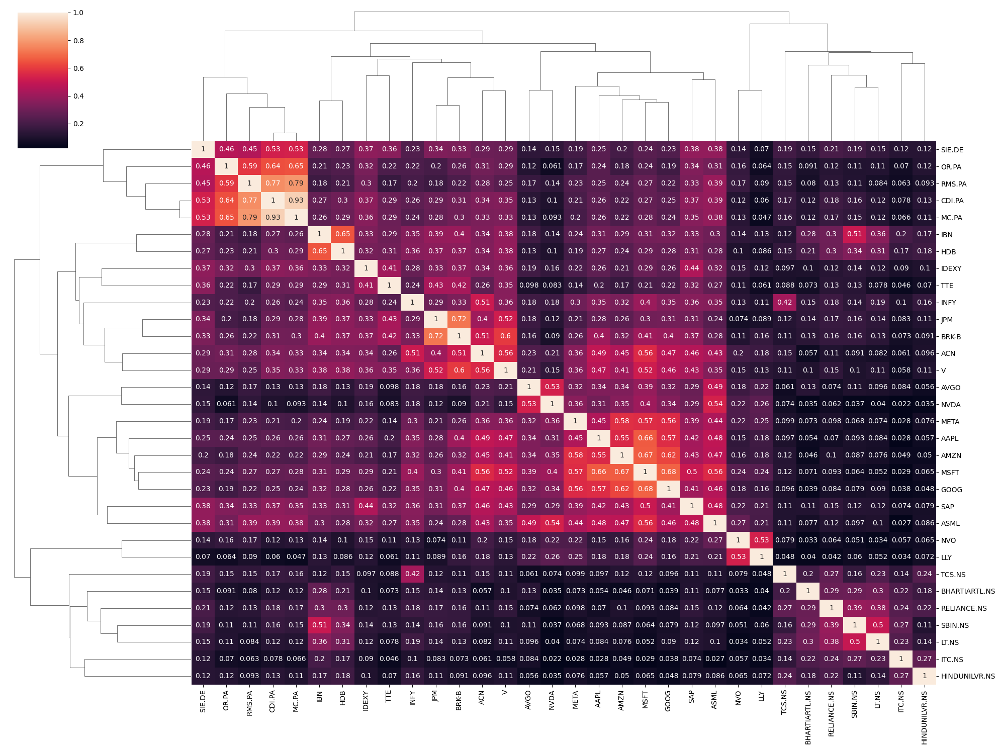

In [36]:
plt.style.use('default')
corr_matrix = dataframe_simple_pivot.loc[start_train:end_test].ffill().diff(1).corr()
clustered_corr = sns.clustermap(corr_matrix, annot=True, figsize=(20, 15), method='average')

plt.show()

Obtain the stocks stored data to replace the indices with the names of the stocks by their information:

In [39]:
stocks_info = get_stocks_info()

First let's compare by region:

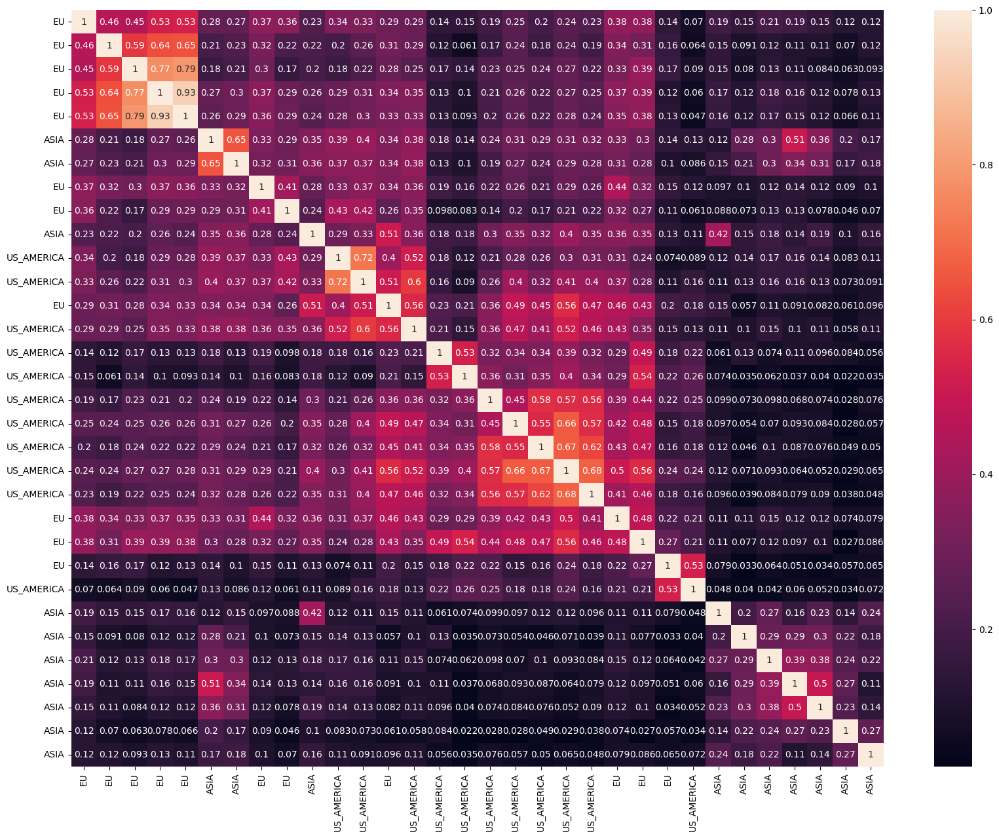

In [40]:
clustered_corr_regions = clustered_corr.data2d.copy()
clustered_corr_regions.index = [stocks_info.filter(pl.col("symbol")==stock).select("region").item() for stock in clustered_corr.data2d.index]
clustered_corr_regions.columns = [stocks_info.filter(pl.col("symbol")==stock).select("region").item() for stock in clustered_corr.data2d.columns]
plt.figure(figsize=(20,15))
sns.heatmap(clustered_corr_regions,annot=True)
plt.show()

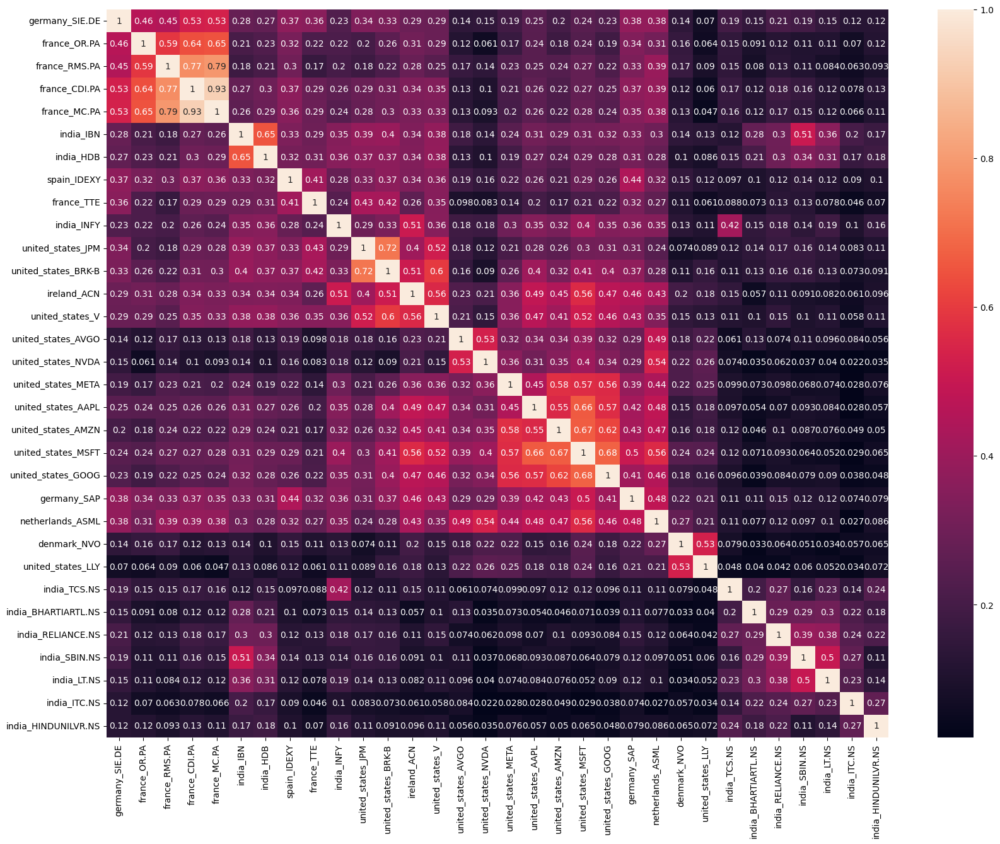

In [41]:
clustered_corr_countries = clustered_corr.data2d.copy()
clustered_corr_countries.index = [stocks_info.filter(pl.col("symbol")==stock).select("country").item() + "_" + stock for stock in clustered_corr.data2d.index]
clustered_corr_countries.columns = [stocks_info.filter(pl.col("symbol")==stock).select("country").item() + "_" + stock for stock in clustered_corr.data2d.columns]
plt.figure(figsize=(20,15))
sns.heatmap(clustered_corr_countries,annot=True)
plt.show()

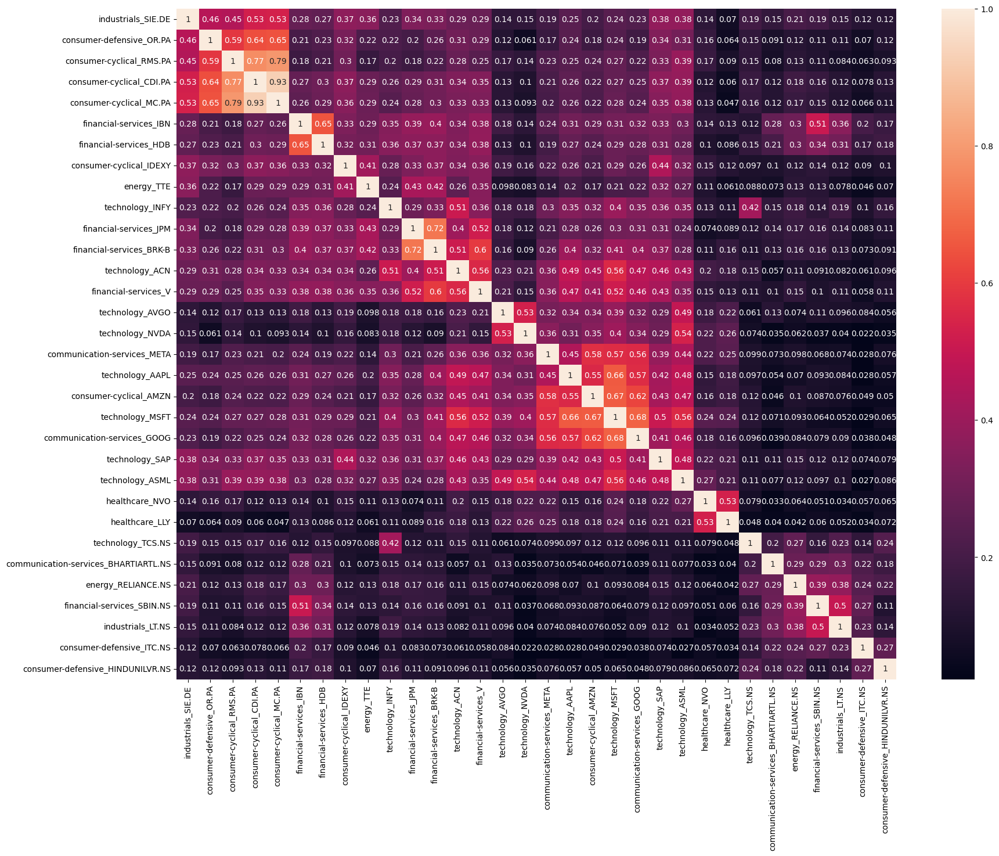

In [42]:
clustered_corr_sector = clustered_corr.data2d.copy()
clustered_corr_sector.index = [stocks_info.filter(pl.col("symbol")==stock).select("sector").item() + "_" + stock for stock in clustered_corr.data2d.index]
clustered_corr_sector.columns = [stocks_info.filter(pl.col("symbol")==stock).select("sector").item() + "_" + stock for stock in clustered_corr.data2d.columns]
plt.figure(figsize=(20,15))
sns.heatmap(clustered_corr_sector,annot=True)
plt.show()

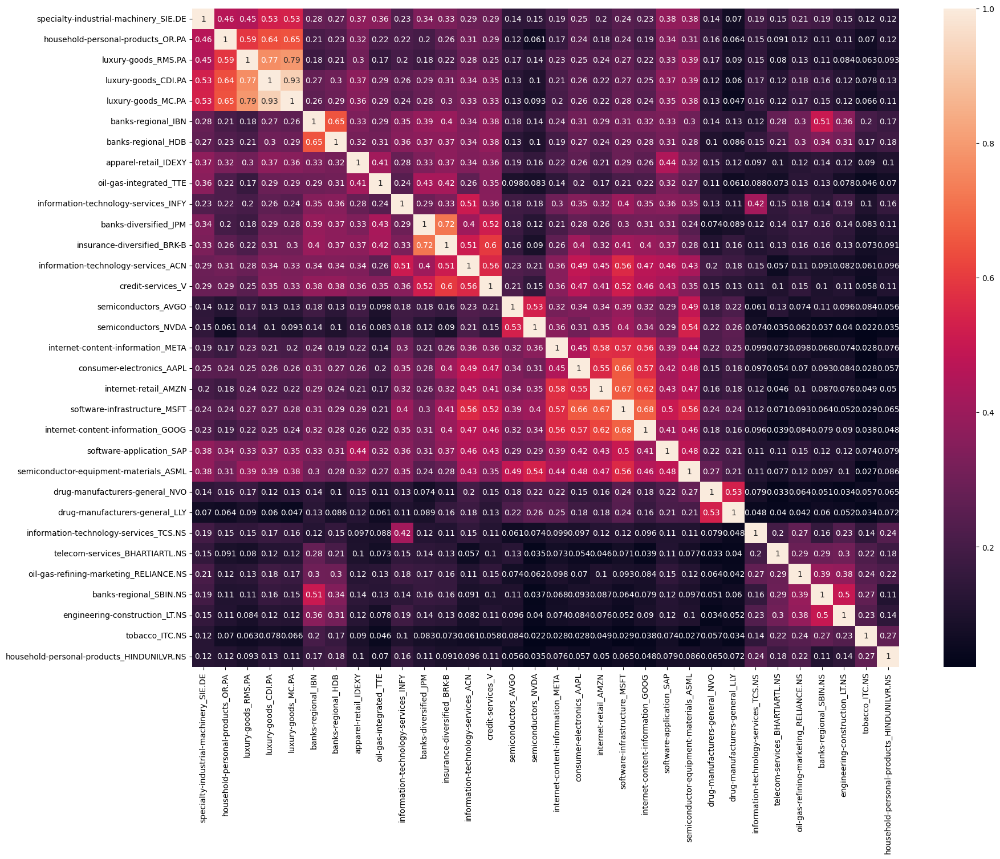

In [43]:
clustered_corr_industry = clustered_corr.data2d.copy()
clustered_corr_industry.index = [stocks_info.filter(pl.col("symbol")==stock).select("industry").item() + "_" + stock for stock in clustered_corr.data2d.index]
clustered_corr_industry.columns = [stocks_info.filter(pl.col("symbol")==stock).select("industry").item() + "_" + stock for stock in clustered_corr.data2d.columns]
plt.figure(figsize=(20,15))
sns.heatmap(clustered_corr_industry,annot=True)
plt.show()

As we can see by the heatmaps, grouped by regions, countries, sectors and industries, there is a high correlation among these categories. Stocks from the same countries are correlated, but the whole effect of this high correlations is not due to just that. Neighbor countries also bear association effects. The same is true for stocks from the same sector and industry. Therefore can extract that:
- Macroeconomical country speficic indicators can add valuable information to a stocks' prediction model. These can include indices like the SNP500 for the US, or EURONEXT for the whole EU or DAX as a country specific one representing the EU, or both for that matter. Additionally, political and economical indicators like the EuroYield can bring information into the table.
- Sector and industry specific information like sector specific indices can also add value about a more specific (and complementary to the region) context of the stock. 

News, and sentimentent that talk about these contexts would have the same role as the above mentioned indicators, although it demands more challenging integrations.

Finally, there are correlations that these industries, sectors or regions do not account for. Let's fuse the heatmap into one to illustrate the example:

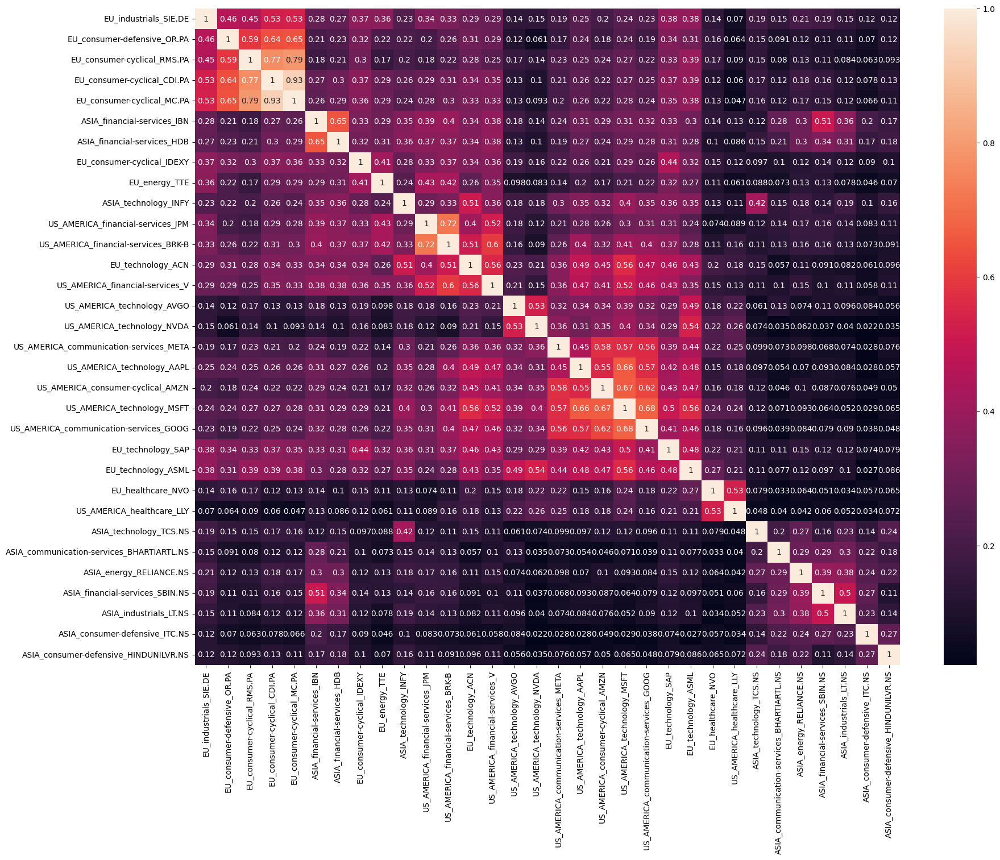

In [44]:
clustered_corr_sector_region = clustered_corr.data2d.copy()
clustered_corr_sector_region.index = [stocks_info.filter(pl.col("symbol")==stock).select("region").item() + "_" + 
                                        stocks_info.filter(pl.col("symbol")==stock).select("sector").item() + "_" + stock for stock in clustered_corr.data2d.index]
clustered_corr_sector_region.columns = [stocks_info.filter(pl.col("symbol")==stock).select("region").item() + "_" +
                                        stocks_info.filter(pl.col("symbol")==stock).select("sector").item() + "_" + stock for stock in clustered_corr.data2d.columns]
plt.figure(figsize=(20,15))
sns.heatmap(clustered_corr_sector_region ,annot=True)
plt.show()

To highlight an example; BRK-B, Berkshire Hathaway, has a considerable correlation with ACN, Accenture. Berkshire Hathaway comes from the US and Accenture supposedly comes from Ireland, but it was in reality originated in the US too. Their sectors are respectively Financial Services and Technology. This raises 2 points:
- The country of origin seems to create more association that they country of headquarter operation. However, the country headquarter operation bears an effect.
- Two seemingly unrelated sectors can be connected through partnerships by the services two companies lend to each other.
- Sector and industry categories can be helpful but restraining, as two categories or sectors can be related just not mathematically, but semantically. This link can be difficult to make straight away programatically for many stocks. 

This interplay between sectors, countries and especially partnerships, begs question to the fact that there is a very interconnected graph of lead-lag cause-effects between stocks that can be difficult to model through tabular data. Also, there might be significant effects in "events" that isn't captured here like X sued Y, product of Z is groundbreaking, etc, which typical impact can be more easily understandable by humans and cannot easily be modelled through a tabular data either. It is true that these events can be modeled through sentiment data, but sentiment itself is a reaction to the event, and modelling through it can be a loss of opportunities.

Anyhow, for now, the suggested approach is to:
- Group by correlated stocks. This way we can extract the implicit correlation accounted for regions, industries and partnerships.
- Add market, economical and political context information: Region, country, sector/industry.
- Later add news and sentiment about both the stock and their context.

Let's create groups of correlated stocks:

In [45]:
# threshold for the grouping
threshold = 0.3
adj_matrix = (clustered_corr.data2d >= threshold).astype(int)
np.fill_diagonal(adj_matrix.values, 0)  # Remove self-loops

# Create a graph from the adjacency matrix
G = nx.from_pandas_adjacency(adj_matrix)

# Find communities with overlapping allowed
communities = list(nx.algorithms.community.greedy_modularity_communities(G))

group_dict = {}
for i, community in enumerate(communities):
    print(f"Group {i+1}: {list(community)}")
    group_dict[f"group_{i+1}"] = [comm for comm in community]

Group 1: ['ACN', 'V', 'TCS.NS', 'AAPL', 'AMZN', 'GOOG', 'INFY', 'META', 'MSFT', 'AVGO', 'ASML', 'NVDA']
Group 2: ['JPM', 'IDEXY', 'SAP', 'OR.PA', 'MC.PA', 'RMS.PA', 'BRK-B', 'SIE.DE', 'CDI.PA', 'TTE']
Group 3: ['IBN', 'RELIANCE.NS', 'HDB', 'LT.NS', 'BHARTIARTL.NS', 'SBIN.NS']
Group 4: ['NVO', 'LLY']
Group 5: ['ITC.NS']
Group 6: ['HINDUNILVR.NS']


Groups 5 and 6 lack other stocks to group, so we can leave them out. Group 4 is made of just 2 stocks, but that is due to being the only ones from the healthcare sector. We can use them and see how well they behave together. Groups 1 to 3 have numerous connections to be modeled together.

### 2.2.2 Model subdivided groups

Hypothesis: Correlated stocks might share a common denominator for price movement, therefore modelling them together can:
- In the case of the recursive method, retain specificity of the model improving score while maintaining speed.
- In the case of the direct method, improve speed, remove useless columns and while allowing to introduce other exogenous series as another dependent series.

Get top lags per groups:

In [46]:
group_lags_acf_dict = {}
group_lags_pacf_dict = {}
for group, tickers_list in group_dict.items():
    group_lags_acf_dict[group] = set()
    group_lags_pacf_dict[group] = set()
    for ticker in tickers_list:
        group_lags_acf_dict[group].update(top_lags_acf_dict[ticker])
        group_lags_pacf_dict[group].update(top_lags_pacf_dict[ticker])

    group_lags_acf_dict[group] = list(group_lags_acf_dict[group])
    group_lags_pacf_dict[group] = list(group_lags_pacf_dict[group])


group_lags_pacf_dict

{'group_1': [1,
  4,
  6,
  7,
  8,
  9,
  11,
  13,
  14,
  15,
  17,
  18,
  19,
  23,
  26,
  27,
  30,
  31,
  32,
  33,
  34,
  38,
  40,
  41,
  42,
  50,
  52,
  55,
  56],
 'group_2': [1,
  2,
  3,
  4,
  6,
  7,
  8,
  9,
  10,
  12,
  13,
  14,
  18,
  20,
  22,
  24,
  26,
  35,
  37,
  38,
  42,
  45,
  46,
  49],
 'group_3': [1,
  3,
  4,
  5,
  6,
  9,
  26,
  27,
  29,
  31,
  37,
  41,
  44,
  45,
  47,
  48,
  49,
  54,
  55,
  56,
  58,
  60],
 'group_4': [32, 6, 8, 27, 10, 13, 23, 59],
 'group_5': [4, 37, 5, 25, 28],
 'group_6': [32, 34, 7, 56, 57]}

Let's start modelling just group 1 as a test.

Trying with the direct approach:

In [ ]:
xgb = XGBRegressor(random_state=8523, objective="reg:absoluteerror")
histb = HistGradientBoostingRegressor(random_state=8523, loss="absolute_error")
data = dataframe_simple_pivot.asfreq("B").interpolate()

targets = data.columns.to_list()


direct_multiseries_args = {
    'dataframe': data,
    "start_train": "2012-06-04",
    "end_val": "2022-05-27",
    "end_test": "2025-01-17",
    "model": histb,
    "forecast_horizon": 5,
    "refit": 24,
    "target_list": targets,
    "predictors_list": targets,
    # "exog_features": None,
    "window_stats": ['mean'],
    "window_sizes": [3,5,7,14], # Top lags from the group, cut to make the evaluation faster
    "lags": [1,2,4,5,6,7,10,14],
    "differentiation": 1
    
}

direct_series_grouped_results, forecasters_grouped_direct = evaluate_direct_multiseries(**direct_multiseries_args)

print(f"The mean MAPE for uniseries is {direct_series_grouped_results['mean_absolute_percentage_error'].mean():.6f}")
direct_series_grouped_results

Checking the direct approach's results, the mean MAPE for the dependent multiseries is 0.023776, which means that the approach of grouping by correlated features does not bring improvements to that model architecture by reducing the width of the table that it takes as input.

Now let's try out with the global independent recursive approach:

In [51]:
data.loc[start_train:end_test,group_dict["group_1"]]

,ACN,V,TCS.NS,AAPL,AMZN,GOOG,INFY,META,MSFT,AVGO,ASML,NVDA
datetime,,,,,,,,,,,,
2012-06-04,44.765903,26.101410,466.877289,17.000189,10.728500,14.359141,3.916655,26.797634,22.821476,2.210763,31.231300,0.268935
2012-06-05,45.260479,26.021387,471.976074,16.956203,10.660500,14.156135,3.971703,25.771557,22.789497,2.274486,32.055237,0.276730
2012-06-06,46.600567,26.599842,481.461731,17.216200,10.882000,14.408279,4.124003,26.707977,23.460964,2.387450,33.624973,0.284067
2012-06-07,46.951565,26.707298,480.319305,17.224024,10.940000,14.350206,4.025834,26.209879,23.365034,2.386002,33.582348,0.272604
2012-06-08,46.688316,26.654711,476.717377,17.483122,10.924000,14.405301,4.001980,26.996874,23.700762,2.450449,34.015629,0.277877
...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-13,349.140015,306.920013,4223.769531,234.399994,218.460007,192.289993,22.690001,608.330017,417.190002,225.289993,727.409973,133.229996
2025-01-14,348.989990,309.089996,4166.629883,233.279999,217.759995,191.050003,22.510000,594.250000,415.670013,224.699997,736.289978,131.759995
2025-01-15,349.730011,316.279999,4182.920898,237.869995,223.350006,196.979996,22.889999,617.119995,426.309998,228.000000,726.299988,136.240005


In [ ]:
start_train = "2012-06-04" # Monday
end_train = '2018-05-28' # Friday
end_val = '2022-05-27' # Friday
start_test = "2022-05-30" # Monday
end_test = '2025-01-17' # Friday

recursive_multiseries_separate_args = {
    "dataframe": data.loc[start_train:end_test,group_dict["group_1"]],
    "start_train": start_train,
    "end_val": end_val,
    "end_test": end_test,
    "model": histb,
    "target_list": group_dict["group_1"], 
    "predictors_list": group_dict["group_1"], 
    "forecast_horizon": 5,
    "window_stats": ['mean']*4,
    "window_sizes": [3,5,7,14],
    "lags": [1,2,4,5,6,7,10,14],
    "differentiation": 1,
    "n_jobs": 1,
    "refit": 24,
    "fixed_train_size": True,
    "suppress_warnings": False,
    "show_progress": True,
    "verbose": False,

}



multi_series_mape_subdivided, backtest_predictions_subdivided = evaluate_recursive_multiseries_dataframe(**recursive_multiseries_separate_args)

  0%|          | 0/138 [00:00<?, ?it/s]

The mean MAPE is 0.023485803256727014


In [ ]:
comparison = direct_series_mape.merge(multi_series_mape_subdivided, on="levels", suffixes=("_direct_dependent",f"_multiseries"), how="left")
comparison.columns = ["levels","direct","recursive"]
comparison["diff_direct_recursive"] = comparison["direct"] - comparison["recursive"] 
comparison.agg({"direct":"mean","recursive":"mean","diff_direct_recursive":"sum"})

Analyzing the results, we can see that the direct method and the recursive are still comparable, being the recursive much faster. What is different between the two is probably the fact that the direct method adds each lagged series as a column, while the recursive simply adds more rows to the dataset, bringing in more examples to the model at the cost of more generalization and losing specific details. For this particular case, the recursive method is prerrable, given its maintainability and speed.

Nevertheless, the are still a few approaches to test to decide for a type of model:
- Adding exogenous features and observing effects for both models
- Refining lag selection through sequential feature selection
- Comparing different ML algorithms
- Tuning the hyperparameters of the chosen model

Let us proceed with them.

### 3.2.2 Refine choice of lags and window stats

To refine the choice of lags, the approach will be to provide a set of possible lags and window sizes, for the models to be training sequentially, finally choosing the combination that yielded the best results for the number of features selected.

Let's define again the dates for consistency.

In [ ]:
data = dataframe_simple_pivot.asfreq("B").ffill()
start_train = "2012-06-04"
end_train = '2018-05-25'
end_val = '2022-05-27'
end_test = '2025-01-17'

data = data.loc[start_train:end_test]
targets = data.columns.to_list()
data

Below, the candidates for window sizes:

In [ ]:
window_stats = ["mean","std","min","max","ratio_min_max","coef_variation"]
window_sizes = [2,3,4,5,6,7,8,9,10,13,15,22,66,126,252]


repeated_window_sizes = list(chain.from_iterable([[size] * len(window_stats) for size in window_sizes]))
repeated_window_stats = window_stats * len(window_sizes)

Finally, the definition of the sequential feature selection. For a first iteration, we will try extracting just the 10 best features, to later compare against the performance of the top 30.

In [ ]:
# Define a time-aware cross-validation strategy
cv = TimeSeriesSplit(n_splits=5)

# Create forecaster
# ==============================================================================
# Define the forecaster. 

window_features = RollingFeatures(stats=repeated_window_stats, window_sizes=repeated_window_sizes)
forecaster_select = ForecasterRecursiveMultiSeries(
                    regressor       = histb,
                    lags            = [1,2,3,4,5,6,7,8,9,10,13,15,22,66,126,252], 
                    window_features=window_features,
                    differentiation=1,
                    differentiator="pct"
                )

forecaster_select.dropna_from_series = True

cv = TimeSeriesSplit(n_splits=5)
selector_10 = SequentialFeatureSelector(
               estimator            = forecaster_select.regressor,
               n_features_to_select = 10,
               direction            = "forward",
               cv                   = cv,
               scoring              = "neg_mean_absolute_percentage_error",
               n_jobs               = 6,
           )

selected_lags_10, selected_window_features_10, selected_exog = select_features_multiseries(
    forecaster   = forecaster_select,
    selector     = selector_10,
    series       = data,
    exog         = None,
    select_only  = 'autoreg',
    subsample    = 0.5,
    random_state = 123,
    verbose      = True,
)



Number of features selected: 10
- Lags            (n=6) : [1, 3, 6, 9, 10, 13]
- Window features (n=4) : ['roll_ratio_min_max_2', 'roll_mean_5', 'roll_mean_15', 'roll_std_15']
- Exog            (n=0) : []

Now, for the 30 best features:

In [ ]:
# Create forecaster
# ==============================================================================
# Define the forecaster. 

window_features = RollingFeatures(stats=repeated_window_stats, window_sizes=repeated_window_sizes)
forecaster_select = ForecasterRecursiveMultiSeries(
                    regressor       = histb,
                    lags            = [1,2,3,4,5,6,7,8,9,10,13,15,22,66,126,252], 
                    window_features=window_features,
                    differentiation=1,
                    differentiator="pct"
                )

forecaster_select.dropna_from_series = True

cv = TimeSeriesSplit(n_splits=5)
selector_30 = SequentialFeatureSelector(
               estimator            = forecaster_select.regressor,
               n_features_to_select = 30,
               direction            = "forward",
               cv                   = cv,
               scoring              = "neg_mean_absolute_percentage_error",
               n_jobs               = 6,
           )

selected_lags_30, selected_window_features_30, selected_exog = select_features_multiseries(
    forecaster   = forecaster_select,
    selector     = selector_30,
    series       = data,
    exog         = None,
    select_only  = 'autoreg',
    subsample    = 0.5,
    random_state = 123,
    verbose      = True,
)



Number of features selected: 30
- Lags            (n=10) : [1, 3, 5, 6, 7, 8, 13, 15, 22, 126]
- Window features (n=20) : ['roll_mean_2', 'roll_coef_variation_2', 'roll_min_3', 'roll_mean_4', 'roll_coef_variation_4', 'roll_mean_5', 'roll_coef_variation_5', 'roll_std_6', 'roll_mean_7', 'roll_std_7', 'roll_mean_8', 'roll_std_9', 'roll_min_9', 'roll_std_10', 'roll_mean_13', 'roll_max_13', 'roll_mean_15', 'roll_std_15', 'roll_ratio_min_max_15', 'roll_ratio_min_max_22'
- Exog            (n=0) : []

In [ ]:
# Repeat the dates here to ensure consistency
start_train = "2012-06-04" # Monday
end_train = '2018-05-28' # Friday
end_val = '2022-05-27' # Friday
start_test = "2022-05-30" # Monday
end_test = '2025-01-17' # Friday

# Training with the top 30 features
recursive_multiseries_separate_args_top30 = {
    "dataframe": data.loc[start_train:end_test,:],
    "start_train": start_train,
    "end_val": end_val,
    "end_test": end_test,
    "model": histb,
    "target_list": data.columns.to_list(), 
    "predictors_list": data.columns.to_list(),
    "forecast_horizon": 5,
    "window_stats": ["mean","coef_variation","min","mean","coef_variation","mean","coef_variation","std","mean","std",'mean', 
                                         'std', 'min', 'std', 'mean', 'max', 'mean', 'std',  'ratio_min_max', 'ratio_min_max'],
    "window_sizes": [2,2,3,4,4,5,5,6,7,7,8,9,9,10,13,13,15,15,15,22],
    "lags": [1, 3, 5, 6, 7, 8, 13, 15, 22, 126],
    "differentiation": 1,
    "n_jobs": 1,
    "refit": 24,
    "fixed_train_size": True,
    "suppress_warnings": False,
    "show_progress": True,
    "verbose": False,

}


multi_series_mape_subdivided_top30, backtest_predictions_subdivided_top30, forecaster_top30 = evaluate_recursive_multiseries_dataframe(**recursive_multiseries_separate_args_top30)


# Training with the top 10 features
recursive_multiseries_separate_args_top10 = {
    "dataframe": data.loc[start_train:end_test,:],
    "start_train": start_train,
    "end_val": end_val,
    "end_test": end_test,
    "model": histb,
    "target_list": data.columns.to_list(), 
    "predictors_list": data.columns.to_list(),
    "forecast_horizon": 5,
    "window_stats": ['ratio_min_max', "mean", "mean", "std"],
    "window_sizes": [2,5,15,15],
    "lags": [1, 3, 6, 9, 10, 13],
    "differentiation": 1,
    "n_jobs": 1,
    "refit": 24,
    "fixed_train_size": True,
    "suppress_warnings": False,
    "show_progress": True,
    "verbose": False,

}

multi_series_mape_subdivided_top10, backtest_predictions_subdivided_top10, forecaster_top10 = evaluate_recursive_multiseries_dataframe(**recursive_multiseries_separate_args_top10)

  0%|          | 0/138 [00:00<?, ?it/s]

Fit index: DatetimeIndex(['2012-06-04', '2012-06-05', '2012-06-06', '2012-06-07',
               '2012-06-08', '2012-06-11', '2012-06-12', '2012-06-13',
               '2012-06-14', '2012-06-15',
               ...
               '2022-05-16', '2022-05-17', '2022-05-18', '2022-05-19',
               '2022-05-20', '2022-05-23', '2022-05-24', '2022-05-25',
               '2022-05-26', '2022-05-27'],
              dtype='datetime64[ns]', name='datetime', length=2605, freq='B')
Initial_train_size: 2605
The mean MAPE is 0.020112595866074005


As per the results, the global independent multiseries benefits from relieving weight off excess columns and performs, even if just slightly, better when only with 10 features. Let's continue by adding exogenous features.

### 3.2.3 Add exogenous features

#### 3.2.3.1 Exog - Cyclical features and market opening calendar

Adding the opening days calendar for each market can allow the model to infer different weights for those days, potentially reducing error. Given that we've seen that both the direct (dependent series) and recursive (independent series) behave similarly, with the difference that depndent series can not be modelled on the latter, we will use the recursive to iterate faster over combinations of exogenous features thanks to its inherent speed.

Let's use the separate model through dict input. First, it is necessary to obtain the data in long format and "business day" frequency.

In [133]:
# Create long dataset
data_long = pd.DataFrame()
dataframe_simple_pd = dataframe_simple.to_pandas().set_index("datetime")
for i, symbol in enumerate(dataframe_simple_pd["symbol"].unique()):
    df_symbol = dataframe_simple_pd.loc[(dataframe_simple_pd["symbol"]==symbol)]
    data_long = pd.concat([data_long, df_symbol.loc[start_train:,].asfreq("B").ffill()],axis=0)

data_long

,close,symbol
datetime,,
2012-06-04,2.210763,AVGO
2012-06-05,2.274486,AVGO
2012-06-06,2.387450,AVGO
2012-06-07,2.386002,AVGO
2012-06-08,2.450449,AVGO
...,...,...
2025-02-03,57.560001,TTE
2025-02-04,59.189999,TTE
2025-02-05,60.320000,TTE


Get calendar features. Then, add the days the stock market are open for their exchanges to mitigate the disruption of (interpolated) missing values. That will cover weekends and holidays for each ticker.

In [134]:
# Create exog
# locate original columns before transformation 
original_columns = data_long.columns

# Get calendar features
data_long_calendar_cyclical = data_long.copy()
data_long_calendar_cyclical = get_calendar_cyclical_features(data_long_calendar_cyclical)

# Get open market days
data_long_calendar_cyclical = get_opening_days_market_exog(data_long_calendar_cyclical, "symbol")

exog_columns = data_long_calendar_cyclical.columns.difference(original_columns).tolist()

Now let's check both the series dataframe,

In [135]:
series_dataframe_long = data_long_calendar_cyclical[original_columns]
series_dataframe_long

,close,symbol
datetime,,
2012-06-04,2.210763,AVGO
2012-06-05,2.274486,AVGO
2012-06-06,2.387450,AVGO
2012-06-07,2.386002,AVGO
2012-06-08,2.450449,AVGO
...,...,...
2025-02-03,57.560001,TTE
2025-02-04,59.189999,TTE
2025-02-05,60.320000,TTE


and the exogenous features dataframe.

In [136]:
exog_dataframe_long = data_long_calendar_cyclical[exog_columns + ["symbol"]]
exog_dataframe_long

,day_of_month_cos,day_of_month_sin,day_of_week_cos,day_of_week_sin,market_open,month_cos,month_sin,week_cos,week_sin,year,symbol
datetime,,,,,,,,,,,
2012-06-04,0.669131,0.743145,1.0,0.000000e+00,1.0,-1.0,1.224647e-16,-0.935016,0.354605,2012,AVGO
2012-06-05,0.500000,0.866025,0.5,8.660254e-01,1.0,-1.0,1.224647e-16,-0.935016,0.354605,2012,AVGO
2012-06-06,0.309017,0.951057,-0.5,8.660254e-01,1.0,-1.0,1.224647e-16,-0.935016,0.354605,2012,AVGO
2012-06-07,0.104528,0.994522,-1.0,1.224647e-16,1.0,-1.0,1.224647e-16,-0.935016,0.354605,2012,AVGO
2012-06-08,-0.104528,0.994522,-0.5,-8.660254e-01,1.0,-1.0,1.224647e-16,-0.935016,0.354605,2012,AVGO
...,...,...,...,...,...,...,...,...,...,...,...
2025-02-03,0.809017,0.587785,1.0,0.000000e+00,1.0,0.5,8.660254e-01,0.748511,0.663123,2025,TTE
2025-02-04,0.669131,0.743145,0.5,8.660254e-01,1.0,0.5,8.660254e-01,0.748511,0.663123,2025,TTE
2025-02-05,0.500000,0.866025,-0.5,8.660254e-01,1.0,0.5,8.660254e-01,0.748511,0.663123,2025,TTE


Now, as the series have different exogenous features (due to different market opening hours), we can take profit from using the global multiseries model, separated into dictionaries but in practice used by the model as a whole.

In [140]:
series_dict_val, exog_dict_val, series_dict_train, exog_dict_train, _ = long_series_exog_to_dict(dataframe = series_dataframe_long.reset_index(),
                                series_id_column = "symbol", 
                                start_train = start_train,
                                end_train = end_val,
                                start_test = end_val,
                                end_test = end_test,
                                exog_dataframe = exog_dataframe_long.reset_index(),
                                index_freq = "B",
                                fill_nan = "ffill",
                                partition_name="Train",
                                verbose = False)


Training the model with exogenous features:

In [142]:
params = {
    "series_train": series_dict_train,
    "series": series_dict_val,
    "model": histb,
    "forecast_horizon": 5,
    "exog_train": exog_dict_train,
    "exog": exog_dict_val,
    "window_stats": ["ratio_min_max","mean","mean","std"],
    "window_sizes": [2,5,15,15],
    "lags": [1, 3, 6, 9, 10, 13],
    "differentiation": 1,
    "transformer_exog": None,
    "n_jobs": 6,
    "refit": 24,
    "encoding": "ordinal",
    "fixed_train_size": True,
    "suppress_warnings": False,
    "show_progress": True,
    "verbose": True
}

metrics_levels, backtest_predictions, forecaster_recursive = evaluate_recursive_multiseries(**params)

Information of folds
--------------------
Number of observations used for initial training: 2604
    First 1 observation/s in training sets are used for differentiation
Number of observations used for backtesting: 690
    Number of folds: 138
    Number skipped folds: 0 
    Number of steps per fold: 5
    Number of steps to exclude between last observed data (last window) and predictions (gap): 0

Fold: 0
    Training:   2012-06-05 00:00:00 -- 2022-05-27 00:00:00  (n=2604)
    Validation: 2022-05-30 00:00:00 -- 2022-06-03 00:00:00  (n=5)
Fold: 1
    Training:   No training in this fold
    Validation: 2022-06-06 00:00:00 -- 2022-06-10 00:00:00  (n=5)
Fold: 2
    Training:   No training in this fold
    Validation: 2022-06-13 00:00:00 -- 2022-06-17 00:00:00  (n=5)
Fold: 3
    Training:   No training in this fold
    Validation: 2022-06-20 00:00:00 -- 2022-06-24 00:00:00  (n=5)
Fold: 4
    Training:   No training in this fold
    Validation: 2022-06-27 00:00:00 -- 2022-07-01 00:00:00  (

  0%|          | 0/138 [00:00<?, ?it/s]

The mean mean_absolute_percentage_error is 0.02042412512180374


The model worsens its score, from 0.0201 to 0.0204. It is not a dramatic increase in error, however, perhaps those numbers can have enough monetary impact. It is to note that the the score is still better than with 30 features, therefore it is quite possible that some of the features are of use, while some of them are not. Therefore, the suggested approach is to add more engineered features and then again select the top 10 to 20 best features.

### 3.2.3.2 Exog - ticker feature engineering 

It is said that within stocks charts most of the necessary information for trading is already contained. This effect is denominated the "Efficient market effect". If this is true, we can at least extract the features that could help distill that information the most.

Taking again the example from AAPL, we can use the candlestick chart to observe some patterns:

In [144]:
aapl = merged_df_with_tech_ind.filter(pl.col("symbol")=="AAPL").select(["datetime",	"close", "high",	"low",	"open",	"volume"])

dv.ticker_candlestick_plot(aapl.to_pandas().set_index("datetime").loc["2020-01-01":"2024-10-01"], ticker_name="Reddit")

- Support and resistance: Support makes reference to the lows in the chart that create a psycological floor in the mind of investors for the price to not pierce through, acting as a pillar for it. Resistance is the opposite principle, it is a previous high for the price, that creates a n effect in the mind of investors that that price is a limit could not previously be surpassed. The lower the support and the higher the resistance, the bigger its supposed effect. The more times those levels have been tested without overcoming them, the stronger. Once these frontiers are broken, support and resistances can be modeled through rolling and expanding min and max.
- Distance to ATH (All Time High): Similar to the previous, it can give information about wether the ticker is creating ATH or is below it, informing about its speculative state.
- Intraday spread: Here, we are focusing on daily close prices. However, there is information hidden inside the daily activity of each ticker, such as the High vs Low, the difference between Open and Close, difference between current Open and previous Close.
- Technical indicators: Besides these previous ideas, there are advanced patterns that can be recognized in prices and that experienced technical analysis investors use to inform their trading decisions.



**Handcrafted indicators**

Let's start by adding first the 'manually' created indicators:

In [155]:
print("Enriching ticker dataframes.")
ticker_df_list = ticker_extender.transform_daily_tickers_parallel_experiment(base_dir / "../data/extracted/OHLCV",forecast_horizon=5)
print("Merging into one collection.")
merged_df_with_tech_ind = ticker_extender.merge_tickers(ticker_df_list)
del ticker_df_list

Enriching ticker dataframes.
Merging into one collection.


The country, sector and industry features are introduced, and as they are categorical, they will need some encoding. One-hot encoding is the go-to solution for that matter.

In [167]:
one_hot_encoder = make_column_transformer(
                      (
                          OneHotEncoder(sparse_output=False, drop='if_binary'),
                          make_column_selector(dtype_exclude=np.number)
                      ),
                      remainder="passthrough",
                      verbose_feature_names_out=False,
                  ).set_output(transform="pandas")

Now creating the long dataframes for model input:

In [180]:
# Exclude the original columns that wont be used
data_long_indicators = merged_df_with_tech_ind.select(pl.exclude(["high","low","open","volume","currency","region"])).filter(pl.col("datetime") >= datetime(2012,6,4))

# Get calendar features
data_long_calendar_cyclical = data_long.copy()
data_long_calendar_cyclical = get_calendar_cyclical_features(data_long_calendar_cyclical)

# Get open market days
data_long_calendar_cyclical = get_opening_days_market_exog(data_long_calendar_cyclical, "symbol")

data_long_indicators_series = data_long_indicators.select(["datetime","close","symbol"])
data_long_indicators_exog = data_long_indicators.select(pl.exclude("close"))

Finally, inputting the dataframes into the ``evaluate_recursive_multiseries_separate()`` that will automatically handle the transformation of the dataframes into dictionaries as needed by the model:

In [170]:
recursive_multiseries_separate_args = {
    "dataframe": data_long_indicators_series.to_pandas(),
    "exog_dataframe": data_long_indicators_exog.to_pandas(),
    "series_id_column": "symbol",
    "start_train": start_train,
    "start_test": end_val,
    "end_train": end_val,
    "end_test": end_test,
    "model": histb,
    "fill_nan": "ffill",
    "forecast_horizon": 5,
    "window_stats": ["ratio_min_max","mean","mean","std"],
    "window_sizes": [2,5,15,15],
    "lags": [1, 3, 6, 9, 10, 13],
    "differentiation": 1,
    "transformer_exog": one_hot_encoder,
    "n_jobs": 4,
    "index_freq": "B",
    "refit": 24,
    "fixed_train_size": True,
    "suppress_warnings": False,
    "show_progress": True,
    "verbose": False
}


metrics_levels, backtest_predictions, forecaster, series_dict_train, exog_dict_train = evaluate_recursive_multiseries_separate(**recursive_multiseries_separate_args)

============================== 
ForecasterRecursiveMultiSeries 
============================== 
Regressor: HistGradientBoostingRegressor 
Lags: [ 1  3  6  9 10 13] 
Window features: ['roll_ratio_min_max_2', 'roll_mean_5', 'roll_mean_15', 'roll_std_15'] 
Window size: 16 
Series encoding: onehot 
Series names (levels): 
    AAPL, ACN, AMZN, ASML, AVGO, BHARTIARTL.NS, BRK-B, CDI.PA, GOOG, HDB,
    HINDUNILVR.NS, IBN, IDEXY, INFY, ITC.NS, JPM, LLY, LT.NS, MC.PA, META, MSFT,
    NVDA, NVO, OR.PA, RELIANCE.NS, RMS.PA, SAP, SBIN.NS, SIE.DE, TCS.NS, TTE, V 
Exogenous included: True 
Exogenous names: 
    industry, sector, country, growth_adj_1d_lagged_5, growth_adj_3d_lagged_5,
    growth_adj_7d_lagged_5, growth_adj_14d_lagged_5, growth_adj_21d_lagged_5,
    growth_adj_30d_lagged_5, growth_adj_90d_lagged_5, growth_adj_365d_lagged_5,
    SMA10_lagged_5, SMA22_lagged_5, SMA33_lagged_5, 30d_volatility_lagged_5,
    high_minus_low_relative_lagged_5, _close_relative_high_low_lagged_5,
    volume_last_5_lagged_5, volume_last_10_lagged_5, volume_last_15_lagged_5,
    volume_last_22_lagged_5, volume_last_66_lagged_5, pct_ATH_lagged_5,
    pct_ATL_lagged_5, pct_1_month_high_lagged_5, ..., pct_5_year_low_lagged_5,
    10_day_rolling_return_lagged_5, 22_day_rolling_return_lagged_5,
    66_day_rolling_return_lagged_5, 126_day_rolling_return_lagged_5,
    10_day_rolling_sharpe_lagged_5, 22_day_rolling_sharpe_lagged_5,
    66_day_rolling_sharpe_lagged_5, 126_day_rolling_sharpe_lagged_5,
    autocorrelation_lag_1_lagged_5, autocorrelation_lag_3_lagged_5,
    autocorrelation_lag_6_lagged_5, autocorrelation_lag_9_lagged_5,
    autocorrelation_lag_10_lagged_5, autocorrelation_lag_13_lagged_5,
    rolling_5_quantile_0.05_lagged_5, rolling_10_quantile_0.05_lagged_5,
    rolling_15_quantile_0.05_lagged_5, rolling_5_quantile_0.95_lagged_5,
    rolling_10_quantile_0.95_lagged_5, rolling_15_quantile_0.95_lagged_5,
    rolling_skew_5_lagged_5, rolling_skew_10_lagged_5, rolling_skew_15_lagged_5,
    SMA_lagged_5 
Transformer for series: None 
Transformer for exog: ColumnTransformer(remainder='passthrough',
                  transformers=[('onehotencoder',
                                 OneHotEncoder(drop='if_binary',
                                               sparse_output=False),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x7eff728cfb50>)],
                  verbose_feature_names_out=False) 
Weight function included: False 
Series weights: None 
Differentiation order: 1 
Training range: 
    'AAPL': ['2012-06-05', '2022-05-27'], 'ACN': ['2012-06-05', '2022-05-27'],
    'AMZN': ['2012-06-05', '2022-05-27'], 'ASML': ['2012-06-05', '2022-05-27'],
    'AVGO': ['2012-06-05', '2022-05-27'], ..., 'SBIN.NS': ['2012-06-05',
    '2022-05-27'], 'SIE.DE': ['2012-06-05', '2022-05-27'], 'TCS.NS':
    ['2012-06-05', '2022-05-27'], 'TTE': ['2012-06-05', '2022-05-27'], 'V':
    ['2012-06-05', '2022-05-27'] 
Training index type: DatetimeIndex 
Training index frequency: B 
Regressor parameters: 
    {'categorical_features': 'from_dtype', 'early_stopping': 'auto',
    'interaction_cst': None, 'l2_regularization': 0.0, 'learning_rate': 0.1,
    'loss': 'absolute_error', 'max_bins': 255, 'max_depth': None,
    'max_features': 1.0, 'max_iter': 100, 'max_leaf_nodes': 31,
    'min_samples_leaf': 20, 'monotonic_cst': None, 'n_iter_no_change': 10,
    'quantile': None, 'random_state': 8523, 'scoring': 'loss', 'tol': 1e-07,
    'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False} 
fit_kwargs: {} 
Creation date: 2025-02-09 21:05:48 
Last fit date: 2025-02-09 21:05:55 
Skforecast version: 0.14.0 
Python version: 3.10.12 
Forecaster id: None

  0%|          | 0/138 [00:00<?, ?it/s]

The mean MAPE is 0.020024730908654132


The exogenous variables do improve the model, even with the calendar features that had increased its error. Now, the interest lies in understanding how these features contribute to predicitions. For that purpose we will trim the model from an excess of features to then study the SHAP values of the remaining ones.

In [ ]:
# Create forecaster
# ==============================================================================
# Define the forecaster. 

forecaster.dropna_from_series = True

cv = TimeSeriesSplit(n_splits=5)
selector = SequentialFeatureSelector(
               estimator            = forecaster.regressor,
               n_features_to_select = 30,
               direction            = "forward",
               cv                   = cv,
               scoring              = "neg_mean_absolute_percentage_error",
               n_jobs               = 6,
           )

selected_lags, selected_window_features, selected_exog = select_features_multiseries(
    forecaster   = forecaster,
    selector     = selector,
    series       = series_dict_train,
    exog         = exog_dict_train,
    select_only  = None,
    subsample    = 0.5,
    random_state = 123,
    verbose      = True,
)



    Lags            (n=3) : [1, 6, 9]
    Window features (n=3) : ['roll_ratio_min_max_2', 'roll_mean_5', 'roll_mean_15']
    Exog            (n=24) : ['country_denmark', 'country_france', 'country_germany', 'country_india', 'country_ireland', 'country_netherlands', 'country_spain', 'country_united_states', 'growth_adj_365dlagged_5', 'SMA22lagged_5', '30d_volatilitylagged_5', 'volume_last_10lagged_5', 'pct_3_month_highlagged_5', 'pct_1_year_highlagged_5', 'pct_6_month_lowlagged_5', '10_day_rolling_returnlagged_5', '22_day_rolling_returnlagged_5', '126_day_rolling_returnlagged_5', '66_day_rolling_sharpelagged_5', 'autocorrelation_lag_1lagged_5', 'autocorrelation_lag_6lagged_5', 'rolling_skew_5lagged_5', 'rolling_skew_10lagged_5', 'rolling_skew_15lagged_5']

Now let's train again the model and see if it gained some accuracy:

In [181]:
recursive_multiseries_separate_args = {
    "dataframe": data_long_indicators_series.to_pandas(),
    "exog_dataframe": data_long_indicators_exog["datetime","symbol","country","industry", "sector", 'growth_adj_365d_lagged_5', 'SMA22_lagged_5', '30d_volatility_lagged_5', 
                                                'volume_last_10_lagged_5', 'pct_3_month_high_lagged_5', 'pct_1_year_high_lagged_5', 'pct_6_month_low_lagged_5', 
                                                '10_day_rolling_return_lagged_5', '22_day_rolling_return_lagged_5', '126_day_rolling_return_lagged_5', '66_day_rolling_sharpe_lagged_5', 
                                                'autocorrelation_lag_1_lagged_5', 'autocorrelation_lag_6_lagged_5', 'rolling_skew_5_lagged_5', 'rolling_skew_10_lagged_5', 'rolling_skew_15_lagged_5'].to_pandas(),
    "series_id_column": "symbol",
    "start_train": start_train,
    "start_test": start_test,
    "end_train": end_val,
    "end_test": end_test,
    "model": histb,
    "fill_nan": "ffill",
    "forecast_horizon": 5,
    "window_stats": ["ratio_min_max","mean","mean"],
    "window_sizes": [2,5,15],
    "lags": [1, 6, 9],
    "differentiation": 1,
    "transformer_exog": one_hot_encoder,
    "n_jobs": 4,
    "index_freq": "B",
    "refit": 24,
    "fixed_train_size": True,
    "suppress_warnings": False,
    "show_progress": True,
    "verbose": False,

}


metrics_levels, backtest_predictions, forecaster, series_dict_train, exog_dict_train = evaluate_recursive_multiseries_separate(**recursive_multiseries_separate_args)

============================== 
ForecasterRecursiveMultiSeries 
============================== 
Regressor: HistGradientBoostingRegressor 
Lags: [1 6 9] 
Window features: ['roll_ratio_min_max_2', 'roll_mean_5', 'roll_mean_15'] 
Window size: 16 
Series encoding: onehot 
Series names (levels): 
    AAPL, ACN, AMZN, ASML, AVGO, BHARTIARTL.NS, BRK-B, CDI.PA, GOOG, HDB,
    HINDUNILVR.NS, IBN, IDEXY, INFY, ITC.NS, JPM, LLY, LT.NS, MC.PA, META, MSFT,
    NVDA, NVO, OR.PA, RELIANCE.NS, RMS.PA, SAP, SBIN.NS, SIE.DE, TCS.NS, TTE, V 
Exogenous included: True 
Exogenous names: 
    country, industry, sector, growth_adj_365d_lagged_5, SMA22_lagged_5,
    30d_volatility_lagged_5, volume_last_10_lagged_5, pct_3_month_high_lagged_5,
    pct_1_year_high_lagged_5, pct_6_month_low_lagged_5,
    10_day_rolling_return_lagged_5, 22_day_rolling_return_lagged_5,
    126_day_rolling_return_lagged_5, 66_day_rolling_sharpe_lagged_5,
    autocorrelation_lag_1_lagged_5, autocorrelation_lag_6_lagged_5,
    rolling_skew_5_lagged_5, rolling_skew_10_lagged_5, rolling_skew_15_lagged_5 
Transformer for series: None 
Transformer for exog: ColumnTransformer(remainder='passthrough',
                  transformers=[('onehotencoder',
                                 OneHotEncoder(drop='if_binary',
                                               sparse_output=False),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x7eff728cfb50>)],
                  verbose_feature_names_out=False) 
Weight function included: False 
Series weights: None 
Differentiation order: 1 
Training range: 
    'AAPL': ['2012-06-04', '2022-05-27'], 'ACN': ['2012-06-04', '2022-05-27'],
    'AMZN': ['2012-06-04', '2022-05-27'], 'ASML': ['2012-06-04', '2022-05-27'],
    'AVGO': ['2012-06-04', '2022-05-27'], ..., 'SBIN.NS': ['2012-06-04',
    '2022-05-27'], 'SIE.DE': ['2012-06-04', '2022-05-27'], 'TCS.NS':
    ['2012-06-04', '2022-05-27'], 'TTE': ['2012-06-04', '2022-05-27'], 'V':
    ['2012-06-04', '2022-05-27'] 
Training index type: DatetimeIndex 
Training index frequency: B 
Regressor parameters: 
    {'categorical_features': 'from_dtype', 'early_stopping': 'auto',
    'interaction_cst': None, 'l2_regularization': 0.0, 'learning_rate': 0.1,
    'loss': 'absolute_error', 'max_bins': 255, 'max_depth': None,
    'max_features': 1.0, 'max_iter': 100, 'max_leaf_nodes': 31,
    'min_samples_leaf': 20, 'monotonic_cst': None, 'n_iter_no_change': 10,
    'quantile': None, 'random_state': 8523, 'scoring': 'loss', 'tol': 1e-07,
    'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False} 
fit_kwargs: {} 
Creation date: 2025-02-09 21:43:27 
Last fit date: 2025-02-09 21:43:34 
Skforecast version: 0.14.0 
Python version: 3.10.12 
Forecaster id: None

  0%|          | 0/138 [00:00<?, ?it/s]

The mean MAPE is 0.01998550646639108


The results show that the model improved when it got rid of some less important features. This makes sense, as many features could very probably provide redundant information while loading the model, deteriorating its performance.

Finally, let's inspect the feature importances:

In [176]:
# Training matrices used by the forecaster to fit the internal regressor
# ==============================================================================
X_train, y_train = forecaster.create_train_X_y(
                       series    = series_dict_train,
                       exog = exog_dict_train
                   )

display(X_train.head(3))
display(y_train.head(3))

# Create SHAP explainer
# ==============================================================================
shap.initjs()
explainer = shap.TreeExplainer(forecaster.regressor)
shap_values = explainer.shap_values(X_train)

,lag_1,lag_6,lag_9,roll_ratio_min_max_2,roll_mean_5,roll_mean_15,AAPL,ACN,AMZN,ASML,...,pct_6_month_low_lagged_5,10_day_rolling_return_lagged_5,22_day_rolling_return_lagged_5,126_day_rolling_return_lagged_5,66_day_rolling_sharpe_lagged_5,autocorrelation_lag_1_lagged_5,autocorrelation_lag_6_lagged_5,rolling_skew_5_lagged_5,rolling_skew_10_lagged_5,rolling_skew_15_lagged_5
2012-06-27,1.002208,1.002783,0.998899,0.978376,0.994758,1.001145,1,0,0,0,...,0.675983,0.025203,0.102613,0.448663,0.073011,-0.374329,0.095623,-0.428683,0.461486,0.103230
2012-06-28,1.004317,0.997156,1.004549,0.997899,0.996191,1.000410,1,0,0,0,...,0.686291,0.010971,0.030576,0.398937,-0.136129,-0.248956,0.129462,-0.502062,0.334166,0.104521
2012-06-29,0.990514,0.986223,1.020292,0.986256,0.997049,0.999748,1,0,0,0,...,0.684676,0.003597,0.045923,0.405343,-0.136354,-0.316437,0.557824,-0.757866,0.254119,0.035473


2012-06-27    1.004317
2012-06-28    0.990514
2012-06-29    1.026272
Name: y, dtype: float64

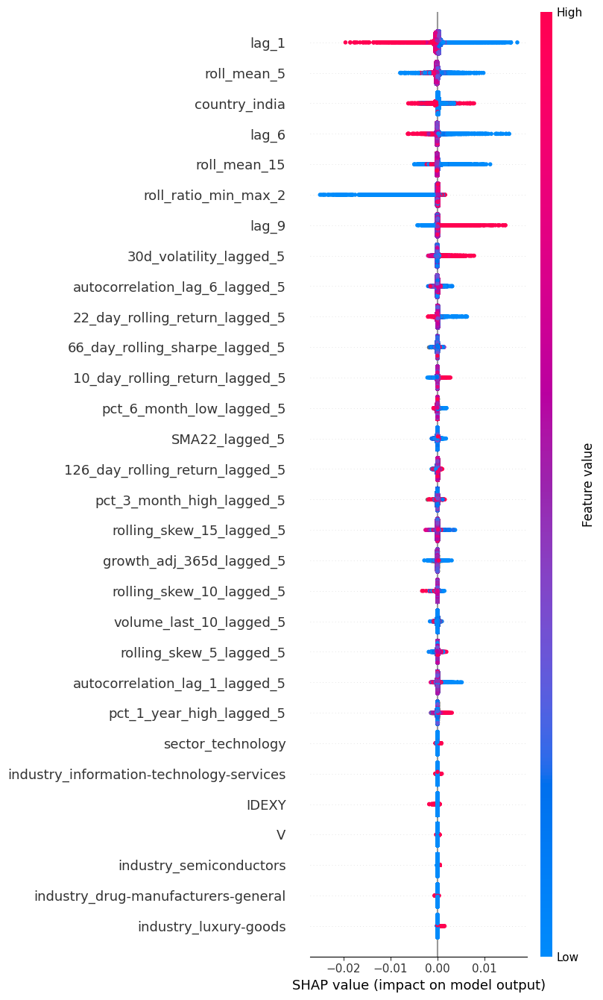

In [177]:
shap.summary_plot(shap_values, X_train, max_display=30)

### 3.2.3.3 Hyperparameter search

In [192]:
# Regressor hyperparameters search space
def search_space_hist_gradient_boosting(trial):
    search_space  = {
        'max_iter'        : trial.suggest_int('max_iter', 100, 1000, step=100),  
        'max_depth'       : trial.suggest_int('max_depth', 3, 10, step=1),
        'learning_rate'   : trial.suggest_float('learning_rate', 0.01, 1),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),  
        'max_leaf_nodes'  : trial.suggest_int('max_leaf_nodes', 10, 100), 
        'l2_regularization': trial.suggest_float('l2_regularization', 0.0, 0.5), 
        'max_bins'        : trial.suggest_int('max_bins', 100, 255),  # Used for histogram binning
        'early_stopping'  : trial.suggest_categorical('early_stopping', [True, False]), 
    } 
    return search_space

In [207]:
# Repeat the dates here to ensure consistency
start_train = "2012-06-04" # Monday
end_train = '2018-05-28' # Friday
end_val = '2022-05-27' # Friday
start_test = "2022-05-30" # Monday
end_test = '2025-01-17' # Friday

series_dict_val, exog_dict_val, series_dict_train, exog_dict_train, _ = long_series_exog_to_dict(dataframe = data_long_indicators_series.to_pandas(),
                                series_id_column = "symbol", 
                                start_train = start_train,
                                end_train = end_train,
                                start_test = end_train,
                                end_test = end_val,
                                exog_dataframe = data_long_indicators_exog["datetime","symbol","country","industry", "sector", 'growth_adj_365d_lagged_5', 'SMA22_lagged_5', '30d_volatility_lagged_5', 
                                                'volume_last_10_lagged_5', 'pct_3_month_high_lagged_5', 'pct_1_year_high_lagged_5', 'pct_6_month_low_lagged_5', 
                                                '10_day_rolling_return_lagged_5', '22_day_rolling_return_lagged_5', '126_day_rolling_return_lagged_5', '66_day_rolling_sharpe_lagged_5', 
                                                'autocorrelation_lag_1_lagged_5', 'autocorrelation_lag_6_lagged_5', 'rolling_skew_5_lagged_5', 'rolling_skew_10_lagged_5', 'rolling_skew_15_lagged_5'].to_pandas(),
                                index_freq = "B",
                                fill_nan = "ffill",
                                partition_name="Train",
                                verbose = False)

series_dict_test, exog_dict_test, _, _, _= long_series_exog_to_dict(dataframe = data_long_indicators_series.to_pandas(),
                                series_id_column = "symbol", 
                                start_train = start_train,
                                end_train = end_val,
                                start_test = start_test,
                                end_test = end_test,
                                exog_dataframe = data_long_indicators_exog["datetime","symbol","country","industry", "sector", 'growth_adj_365d_lagged_5', 'SMA22_lagged_5', '30d_volatility_lagged_5', 
                                                'volume_last_10_lagged_5', 'pct_3_month_high_lagged_5', 'pct_1_year_high_lagged_5', 'pct_6_month_low_lagged_5', 
                                                '10_day_rolling_return_lagged_5', '22_day_rolling_return_lagged_5', '126_day_rolling_return_lagged_5', '66_day_rolling_sharpe_lagged_5', 
                                                'autocorrelation_lag_1_lagged_5', 'autocorrelation_lag_6_lagged_5', 'rolling_skew_5_lagged_5', 'rolling_skew_10_lagged_5', 'rolling_skew_15_lagged_5'].to_pandas(),
                                index_freq = "B",
                                fill_nan = "ffill",
                                partition_name="Validation",
                                verbose = False)

In [208]:
def hyperparameter_tuning(search_space, series_dict_train, series_dict_val, exog_dict_val, model,window_stats, window_sizes,lags, transformer_exog=None, differentiation = 1,  encoding="onehot"):
    # Fit forecaster
    # ==============================================================================
    # Define the forecaster. 
    window_features = RollingFeatures(stats=window_stats, window_sizes=window_sizes)
    forecaster_recursive = ForecasterRecursiveMultiSeries(
                        regressor        = model,
                        lags             = lags,
                        window_features  = window_features,
                        differentiation  = differentiation,
                        differentiator   = "pct",
                        transformer_exog = transformer_exog,
                        encoding         = encoding,
                    )

    cv_search = OneStepAheadFold(initial_train_size = len(next(iter(series_dict_train.values()))))

    results_search, best_trial = bayesian_search_forecaster_multiseries(
        forecaster        = forecaster_recursive,
        series            = series_dict_val,
        exog              = exog_dict_val,
        cv                = cv_search,
        search_space      = search_space,
        n_trials          = 30,
        metric            = "mean_absolute_percentage_error",
        return_best       = True,
        verbose           = False,
        n_jobs            = "auto",
        show_progress     = True,
        suppress_warnings = True,
    )

    return results_search, best_trial

In [209]:
results_search_histb, best_trial_histb = hyperparameter_tuning(search_space=search_space_hist_gradient_boosting, 
                      series_dict_train=series_dict_train, 
                      series_dict_val=series_dict_val,
                      exog_dict_val=exog_dict_val, 
                      model=histb, 
                      window_stats= ["ratio_min_max","mean","mean"],
                      window_sizes= [2,5,15],
                      lags= [1, 6, 9],
                      transformer_exog=one_hot_encoder)

  0%|          | 0/30 [00:00<?, ?it/s]

/home/miguel/data_science/algorithmic_trading/.venv/lib/python3.10/site-packages/skforecast/recursive/_forecaster_recursive_multiseries.py:1086: MissingValuesWarning:

NaNs detected in `X_train`. Some regressors do not allow NaN values during training. If you want to drop them, set `forecaster.dropna_from_series = True`. 
 You can suppress this warning using: warnings.simplefilter('ignore', category=MissingValuesWarning)



`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [1 6 9] 
  Parameters: {'max_iter': 200, 'max_depth': 8, 'learning_rate': 0.013837759381320008, 'min_samples_leaf': 7, 'max_leaf_nodes': 23, 'l2_regularization': 0.4322324323818845, 'max_bins': 171, 'early_stopping': True}
  Backtesting metric: 0.23681853330741498
  Levels: ['AAPL', 'ACN', 'AMZN', 'ASML', 'AVGO', 'BHARTIARTL.NS', 'BRK-B', 'CDI.PA', 'GOOG', 'HDB', 'HINDUNILVR.NS', 'IBN', 'IDEXY', 'INFY', 'ITC.NS', 'JPM', 'LLY', 'LT.NS', 'MC.PA', 'META', 'MSFT', 'NVDA', 'NVO', 'OR.PA', 'RELIANCE.NS', 'RMS.PA', 'SAP', 'SBIN.NS', 'SIE.DE', 'TCS.NS', 'TTE', 'V']



In [ ]:
best_params = results_search_histb.at[0, 'params']
params = {
    "series_train": series_dict_val,
    "series": series_dict_test,
    "model": HistGradientBoostingRegressor(random_state=8523, loss="quantile", quantile=0.5, **best_params),
    "forecast_horizon": 5,
    "exog_train": exog_dict_val,
    "exog": exog_dict_test,
    "window_stats": ["ratio_min_max","mean","mean"],
    "window_sizes": [2,5,15],
    "lags": [1, 6, 9],
    "differentiation": 1,
    "transformer_exog": one_hot_encoder,
    "n_jobs": 6,
    "refit": 24,
    "encoding": "onehot",
    "fixed_train_size": True,
    "suppress_warnings": False,
    "show_progress": True,
    "verbose": True
}

metrics_levels, backtest_predictions, forecaster_recursive = evaluate_recursive_multiseries(**params)

/home/miguel/data_science/algorithmic_trading/.venv/lib/python3.10/site-packages/skforecast/recursive/_forecaster_recursive_multiseries.py:1086: MissingValuesWarning:

NaNs detected in `X_train`. Some regressors do not allow NaN values during training. If you want to drop them, set `forecaster.dropna_from_series = True`. 
 You can suppress this warning using: warnings.simplefilter('ignore', category=MissingValuesWarning)

/home/miguel/data_science/algorithmic_trading/.venv/lib/python3.10/site-packages/skforecast/model_selection/_validation.py:577: IgnoredArgumentWarning:

If `refit` is an integer other than 1 (intermittent refit). `n_jobs` is set to 1 to avoid unexpected results during parallelization. 
 You can suppress this warning using: warnings.simplefilter('ignore', category=IgnoredArgumentWarning)



Information of folds
--------------------
Number of observations used for initial training: 2604
    First 1 observation/s in training sets are used for differentiation
Number of observations used for backtesting: 690
    Number of folds: 138
    Number skipped folds: 0 
    Number of steps per fold: 5
    Number of steps to exclude between last observed data (last window) and predictions (gap): 0

Fold: 0
    Training:   2012-06-05 00:00:00 -- 2022-05-27 00:00:00  (n=2604)
    Validation: 2022-05-30 00:00:00 -- 2022-06-03 00:00:00  (n=5)
Fold: 1
    Training:   No training in this fold
    Validation: 2022-06-06 00:00:00 -- 2022-06-10 00:00:00  (n=5)
Fold: 2
    Training:   No training in this fold
    Validation: 2022-06-13 00:00:00 -- 2022-06-17 00:00:00  (n=5)
Fold: 3
    Training:   No training in this fold
    Validation: 2022-06-20 00:00:00 -- 2022-06-24 00:00:00  (n=5)
Fold: 4
    Training:   No training in this fold
    Validation: 2022-06-27 00:00:00 -- 2022-07-01 00:00:00  (

/home/miguel/data_science/algorithmic_trading/.venv/lib/python3.10/site-packages/skforecast/recursive/_forecaster_recursive_multiseries.py:1086: MissingValuesWarning:

NaNs detected in `X_train`. Some regressors do not allow NaN values during training. If you want to drop them, set `forecaster.dropna_from_series = True`. 
 You can suppress this warning using: warnings.simplefilter('ignore', category=MissingValuesWarning)



  0%|          | 0/138 [00:00<?, ?it/s]

/home/miguel/data_science/algorithmic_trading/.venv/lib/python3.10/site-packages/skforecast/recursive/_forecaster_recursive_multiseries.py:1086: MissingValuesWarning:

NaNs detected in `X_train`. Some regressors do not allow NaN values during training. If you want to drop them, set `forecaster.dropna_from_series = True`. 
 You can suppress this warning using: warnings.simplefilter('ignore', category=MissingValuesWarning)

/home/miguel/data_science/algorithmic_trading/.venv/lib/python3.10/site-packages/skforecast/recursive/_forecaster_recursive_multiseries.py:1086: MissingValuesWarning:

NaNs detected in `X_train`. Some regressors do not allow NaN values during training. If you want to drop them, set `forecaster.dropna_from_series = True`. 
 You can suppress this warning using: warnings.simplefilter('ignore', category=MissingValuesWarning)



The mean mean_absolute_percentage_error is 0.019971851857082917


: 